# Human Resources Analysis: Predict Attrition (Descriptive Analysis)

### Group 15
    Francisco Costa, 20181393
    João Gouveia, 20181399
    Nuno Rocha, 20181407
    Pedro Rivera, 20181411

<a class="anchor" id="Table_Contents"></a>
# TABLE OF CONTENTS
<br></br>
* [# 1. Business Understanding](#business-understanding)


* [# 2. Data Understanding](#data-understanding)
    * [2.1: Collect the data](#collect-the-data)
    
    * [2.2: Describe the data](#describe-the-data)
    
    * [2.3: Explore the data](#explore-the-data)
        * [2.3.1: Demographics](#demographics)   
            * [Key Insights](#demographics-ki)
        * [2.3.2: Job Specifics](#job)   
            * [Key Insights](#job-ki)
        * [2.3.3: Job History](#jobhistory)   
            * [Key Insights](#jobhistory-ki)            
        * [2.3.4: Employee Performance, Satisfaction & Training](#perf_sats_train)   
            * [Key Insights](#perf_sats_train-ki)              
        * [2.3.5: Remuneration](#remun)   
            * [Key Insights](#remun-ki)             
        * [2.3.5: Rates](#rates)   
            * [Key Insights](#rates-ki)               
    * [2.4: Verify the data quality](#verify-data-quality)
        * [Key Insights](#dataquality-ki) 


* [# 3. Data Preparation](#data-preparation)
    * [3.1: Clean the data](#clean-the-data)

    * [3.2: Transform the data](#transform-the-data)
        * [3.2.1: Transformations to archieve "normality"](#transform-normality)
        * [3.2.2: Create flag variables](#flag-variables)
        * [3.2.3: Normalize the data](#normalize-the-data)

    * [3.3: Select the data](#select-the-data)
        * [3.3.1: Correlation Matrix for Ratio Variables](#select-corr)
        * [3.3.2: Clustering Analysis (Interpreting Attrition)](#clustering_attrition)
            * [3.3.2.1: Who are the employees in attrition (based on JobRole)?](#clustering_attrition_who)        
            * [3.3.2.2: What are the drivers for employee attrition (based on JobRole)?](#clustering_attrition_drivers) 
                * [3.3.2.2.1: Sales Representative](#clustering_attrition_drivers_SR)
                    * [Key Insights](#clustering_attrition_drivers_SR-ki)
                * [3.3.2.2.2: Laboratory Technician](#clustering_attrition_drivers_LT)
                    * [Key Insights](#clustering_attrition_drivers_LT-ki)
                * [3.3.2.2.3: Human Resources](#clustering_attrition_drivers_HR)
                    * [Key Insights](#clustering_attrition_drivers_HR-ki)
                * [3.3.2.2.4: Sales Executive](#clustering_attrition_drivers_SE)
                    * [Key Insights](#clustering_attrition_drivers_SE-ki)                    
                * [3.3.2.2.5: Research Scientist](#clustering_attrition_drivers_RS)
                    * [Key Insights](#clustering_attrition_drivers_RS-ki)  
                * [3.3.2.2.6: Manufacturing Director](#clustering_attrition_drivers_MD)
                    * [Key Insights](#clustering_attrition_drivers_MD-ki)  
                * [3.3.2.2.7: Healthcare Representative](#clustering_attrition_drivers_HRep)
                    * [Key Insights](#clustering_attrition_drivers_HRep-ki)                      
                * [3.3.2.2.8: Manager](#clustering_attrition_drivers_M)
                    * [Key Insights](#clustering_attrition_drivers_M-ki)                        
                * [3.3.2.2.9: Research Director](#clustering_attrition_drivers_RD)
                    * [Key Insights](#clustering_attrition_drivers_RD-ki)            
            * [3.3.2.3: And what could the company do to prevent it?](#clustering_attrition_recomendations) 
            * [3.3.2.4:	Is the company losing the top performers (internal perspective)?](#clustering_attrition_performance)        
        * [3.3.3: Clustering Analysis (Feature Creation)](#clustering_features)
            * [3.3.3.1: Clustering JobRole](#clustering_features_JobRole)
                * [3.3.3.1.1: Sales Representative](#clustering_features_JobLevel_SR)
                * [3.3.3.1.2: Laboratory Technician](#clustering_features_JobLevel_LT)
                * [3.3.3.1.3: Human Resources](#clustering_features_JobLevel_HR)
                * [3.3.3.1.4: Sales Executive](#clustering_features_JobLevel_SE)
                * [3.3.3.1.5: Research Scientist](#clustering_features_JobLevel_RS)
        * [3.3.4: Feature Importance (Decision Tree Classifier): Raw Dataset](#feature-importance_raw)
        * [3.3.5: Feature Importance (Decision Tree Classifier): Selected Dataset](#feature-importance_selected)

<a class="anchor" id="business-understanding"></a>
# 1. Business Understanding 

The main goals are:

- <b>Descriptive Analytics</b>: Find correlations between the different variables, possibility of clustering analysis, build nice visualizations that may help to get better insights for the analysis, check feature’s cardinality and analyze possible highly correlation features that may be removed and still achieve good results.


- <b>Predictive Analytics</b>: Build classification models to predict the Attrition probability and the final classification given by the model.

In [1]:
# Import the required libraries
import pandas as pd
pd.options.display.max_columns = None
pd.options.display.float_format = '{:.4f}'.format

import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
import seaborn as sns
import itertools

Import the plot functions that we have defined in a separate .py file to be used below.

In [2]:
import fPlots

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="data-understanding"></a>
# 2. Data Understanding

<a class="anchor" id="collect-the-data"></a>
### 2.1: Collect the data

In [3]:
# Import the Dataset
df = pd.read_csv('HR_DS.csv')
df.head(n = 5).T

,0,1,2,3,4
Age,41,49,37,33,27
Attrition,Yes,No,Yes,No,No
BusinessTravel,Travel_Rarely,Travel_Frequently,Travel_Rarely,Travel_Frequently,Travel_Rarely
DailyRate,1102,279,1373,1392,591
Department,Sales,Research & Development,Research & Development,Research & Development,Research & Development
DistanceFromHome,1,8,2,3,2
Education,2,1,2,4,1
EducationField,Life Sciences,Life Sciences,Other,Life Sciences,Medical
EmployeeCount,1,1,1,1,1
EmployeeNumber,1,2,4,5,7


[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="describe-the-data"></a>
### 2.2: Describe the data

In [4]:
# Get general information regarding the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
Age                         1470 non-null int64
Attrition                   1470 non-null object
BusinessTravel              1470 non-null object
DailyRate                   1470 non-null int64
Department                  1470 non-null object
DistanceFromHome            1470 non-null int64
Education                   1470 non-null int64
EducationField              1470 non-null object
EmployeeCount               1470 non-null int64
EmployeeNumber              1470 non-null int64
EnvironmentSatisfaction     1470 non-null int64
Gender                      1470 non-null object
HourlyRate                  1470 non-null int64
JobInvolvement              1470 non-null int64
JobLevel                    1470 non-null int64
JobRole                     1470 non-null object
JobSatisfaction             1470 non-null int64
MaritalStatus               1470 non-null object
MonthlyIncome         

<b>Notes</b>:
   <p> There are no null values for all variables (they all have 1470 records).</p>
   <p>The variables `Attrition`, `Over18` and `OverTime` as binary should be converted to 1/0 type int.</p>

In [5]:
# Describe the numerical variables
df.describe(include = [np.number]).T

,count,mean,std,min,25%,50%,75%,max
Age,1470.0000,36.9238,9.1354,18.0000,30.0000,36.0000,43.0000,60.0000
DailyRate,1470.0000,802.4857,403.5091,102.0000,465.0000,802.0000,1157.0000,1499.0000
DistanceFromHome,1470.0000,9.1925,8.1069,1.0000,2.0000,7.0000,14.0000,29.0000
Education,1470.0000,2.9129,1.0242,1.0000,2.0000,3.0000,4.0000,5.0000
EmployeeCount,1470.0000,1.0000,0.0000,1.0000,1.0000,1.0000,1.0000,1.0000
EmployeeNumber,1470.0000,1024.8653,602.0243,1.0000,491.2500,1020.5000,1555.7500,2068.0000
EnvironmentSatisfaction,1470.0000,2.7218,1.0931,1.0000,2.0000,3.0000,4.0000,4.0000
HourlyRate,1470.0000,65.8912,20.3294,30.0000,48.0000,66.0000,83.7500,100.0000
JobInvolvement,1470.0000,2.7299,0.7116,1.0000,2.0000,3.0000,3.0000,4.0000
JobLevel,1470.0000,2.0639,1.1069,1.0000,1.0000,2.0000,3.0000,5.0000


<b>Note</b>:
   <p> We can drop the variables `EmployeeCount` and `StandardHours` since they do not change across the dataset (std=0).</p>

In [6]:
# Describe the categorical variables
df.describe(include = [np.object]).T

,count,unique,top,freq
Attrition,1470,2,No,1233
BusinessTravel,1470,3,Travel_Rarely,1043
Department,1470,3,Research & Development,961
EducationField,1470,6,Life Sciences,606
Gender,1470,2,Male,882
JobRole,1470,9,Sales Executive,326
MaritalStatus,1470,3,Married,673
Over18,1470,1,Y,1470
OverTime,1470,2,No,1054


<b>Note</b>:
   <p> We can drop the variable `Over18` since it does not change across the dataset (only one unique value).</p>
    
<p> Next we will drop and perform the type conversions as expressed in the notes above.</p>

In [7]:
# drop variables
df.drop(columns=['EmployeeCount', 'StandardHours', 'Over18'], inplace = True)

# perform type convertions where required
df.loc[:,'Attrition'] = df.loc[:,'Attrition'].map(lambda x: 1 if x == "Yes" else 0) # there are only 2 unique values
df.loc[:,'OverTime'] = df.loc[:,'OverTime'].map(lambda x: 1 if x =="Yes" else 0) # there are only 2 unique values

So, we can now conclude that the dataset contains the following data types:
- <u>Nominal Variables</u>: `BusinessTravel`, `Department`, `EducationField`, `Gender`, `JobRole`, `MaritalStatus`
    - Dummy Variables: `Attrition`, `OverTime`


- <u>Ordinal Variables</u>: `Education`, `EmployeeNumber`, `EnvironmentSatisfaction`, `JobInvolvement`, `JobLevel`, `JobSatisfaction`, `PerformanceRating`, `RelationshipSatisfaction`, `StockOptionLevel`, `WorkLifeBalance`


- <u>Ratio Variables</u>: `DailyRate`, `HourlyRate`, `MonthlyIncome`, `MonthlyRate`, `Age`, `DistanceFromHome`, `NumCompaniesWorked`, `PercentSalaryHike`, `TotalWorkingYears`, `TrainingTimesLastYear`, `YearsAtCompany`, `YearsInCurrentRole`, `YearsSinceLastPromotion`, `YearsWithCurrManager`

In [8]:
NominalVars = ['BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus']
OrdinalVars = ['Education', 'EmployeeNumber', 'EnvironmentSatisfaction', 'JobInvolvement', 'JobLevel',\
               'JobSatisfaction', 'PerformanceRating', 'RelationshipSatisfaction', 'StockOptionLevel',\
               'WorkLifeBalance']
RatioVars = ['DailyRate', 'HourlyRate', 'MonthlyIncome', 'MonthlyRate', 'Age', 'DistanceFromHome', \
             'NumCompaniesWorked', 'PercentSalaryHike', 'TotalWorkingYears', 'TrainingTimesLastYear', \
             'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', \
             'YearsWithCurrManager']

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="explore-the-data"></a>
### 2.3: Explore the data

In [9]:
# Create some derived variables (_dv)
df['YAtCompany_TotalWorkY_dv'] = df.apply(lambda row: np.nan if row['TotalWorkingYears'] == 0 \
                                                  else row['YearsAtCompany'] / row['TotalWorkingYears'], axis = 1)

df['NumCompWork_TotalWorkY_dv'] = df.apply(lambda row: np.nan if row['TotalWorkingYears'] == 0 \
                                                  else row['NumCompaniesWorked'] / row['TotalWorkingYears'], axis = 1)

df['DRate_HRate_dv'] = df.apply(lambda row: np.nan if row['HourlyRate'] == 0 \
                                                  else row['DailyRate'] / row['HourlyRate'], axis = 1)

df['MRate_DRate_dv'] = df.apply(lambda row: np.nan if row['DailyRate'] == 0 \
                                                  else row['MonthlyRate'] / row['DailyRate'], axis = 1)

df['MonthlyProfit_dv'] = df.apply(lambda row: row['MonthlyRate'] - row['MonthlyIncome'], axis = 1)

RatioVars.extend(['YAtCompany_TotalWorkY_dv', 'MonthlyProfit_dv', \
                  'NumCompWork_TotalWorkY_dv', \
                  'DRate_HRate_dv','MRate_DRate_dv',])

How many employees are in attrition?

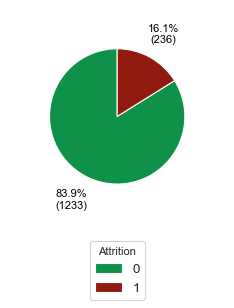

In [10]:
figDepVar__all = fPlots.f_DepVar_analysis(df)
plt.show(figDepVar__all)

<a class="anchor" id="demographics"></a>
#### 2.3.1: Demographics

Who are the employees of the company? Are there any patterns relating their characteristics and the `Attrition`?

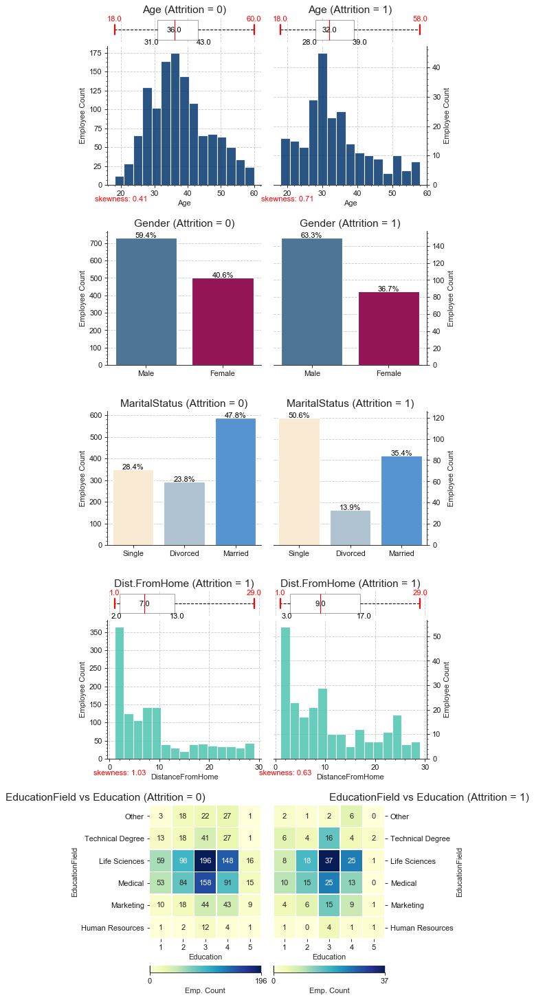

In [11]:
figDemographics_all = fPlots.f_Demographics_analysis(df)
plt.show(figDemographics_all)

<a class="anchor" id="demographics-ki"></a>
<b>Key Insights</b>:
   > <p> In general terms, the employees with attrition are relatively younger. </p>
   > <p> There are more males working at the company. However, the rations of genders in the "Attrition" and "No Attrition" group are similar. </p>
   > <p> The % of Singles is much higher in the group of employees that show some attrition. </p>
   > <p> There is no identifiable difference in the distribution of distance from home in both groups. </p>
   > <p> Similarly, there is also no difference regarding the comparison between the Education Field and the Education level. </p>

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="job"></a>
#### 2.3.2: Job Specifics

What are the jobs & roles in the company? Are there any patterns relating their characteristics and the `Attrition`?

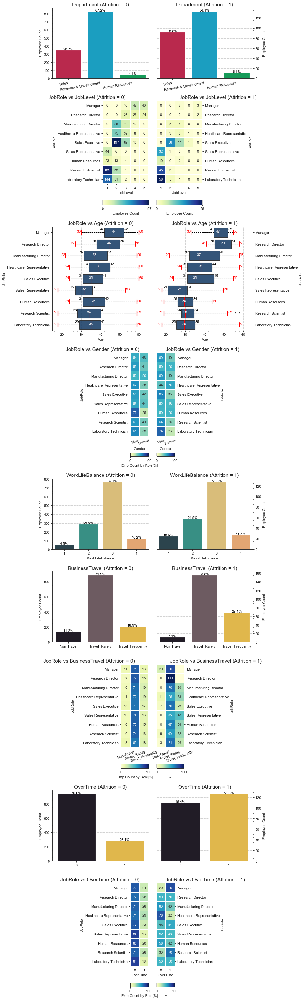

In [12]:
figJobsRoles_all = fPlots.f_JobRoles_analysis(df)
plt.show(figJobsRoles_all)

<a class="anchor" id="job-ki"></a>
<b>Key Insights</b>:
   > <p> Regarding the Department, in the group of employees with attrition, the % of sales' workers is 10 percentual points higher when compared to the "No Attrition" one.  </p>
   > <p> On another hand, in terms of Job Roles, we can conclude that employees in highest roles (Managers and Directors) are the ones with the lowest levels of attrition. Also, it is clear that, the majority of employees represented in the attrition group are the ones with the lowest job level.</p>
   > <p> When comparing the Age and the Job Role, we can conclude that the job roles related with sales, scientists and technicians have a pattern where the youngest employees tend to highlight in terms of attrition.</p>
   > <p> When comparing Gender and Job Role in the two groups, Healthcare Representatives and Human Resources are the job roles that does not follow the same proportion in the two groups, since in the Attrition group the proportion of females is much higher than when they are not. </p>
   > <p> In terms of WorkLife Balance, there is no identifiable difference in the distribution in both groups. </p>
   > <p> We can conclude that the fact of an employee travel or not, can be important when considering if he's a member of the attrition group. The "Attrition" group has a higher % of frequent travellers when compared to the one from "No Attrition". </p>
   > <p> It is in the OverTime's analysis that is possible to observe one of the highest differences between the two groups. In the "Attrition" group, there are more employees working over time than not doing it. However, it does not occur in the "No Attrition" group.  </p>

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="jobhistory"></a>
#### 2.3.3: Job History

What about the job history? Are there any patterns relating the job history and the `Attrition`?

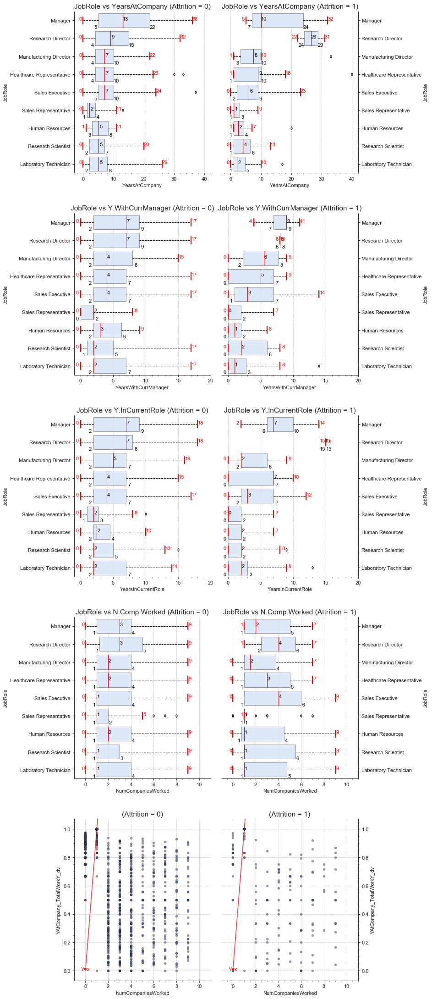

In [13]:
figJobHistory_all = fPlots.f_JobHistory_analysis(df)
plt.show(figJobHistory_all)

<a class="anchor" id="jobhistory-ki"></a>
<b>Key Insights</b>:
   > <p> In terms of Years at the Company, the biggest difference is on the Research Directors. These employees had been working for a long time in the company, dedicating it more than 80% of their working life. Also, the employees on the top down job roles are the ones who earlier make part of the attrition group.</p>
   > <p> Surprisingly, the employees with no attrition are also the one that had been more years in the same role. </p>
   > <p> Regarding the number of companies worked, the major difference between the two groups is on the Sales Executives: the employees who worked in a higher number of companies are the ones with attrition. </p>

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="perf_sats_train"></a>
#### 2.3.4: Employee Performance, Satisfaction & Training

What are the job history among the employees? Are there any patterns relating the job history and the `Attrition`?

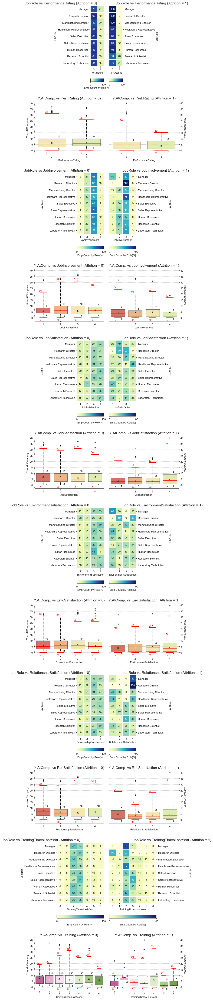

In [14]:
figPerfSatisfTran_all = fPlots.f_PerfSatisfTran_analysis(df)
plt.show(figPerfSatisfTran_all)

<a class="anchor" id="perf_sats_train-ki"></a>
<b>Key Insights</b>:
   > <p> Regarding the Performance Rating, the only great difference between the two groups of employees is that for the manager and directors job roles, the ones in the attrition group have all a performance rating of 3. </p>
   > <p> The majority of employees have a level 3 of Jov Envolvement, either on the group with attrition or without it. </p>
   > <p> It would be expected to observe differences in terms of Job Satisfaction but that does not happen. There are indeed higher percentages of employees with lower levels of satisfaction in the "Attrition" group, but those differences are not significant (only perhaps in employees from Human Resources). </p>
   > <p> However, in Environment Satisfaction and Relationship Satisfaction there are some differences. In general, the employees that show some attrition register low levels of these two variables. </p>
   > <p> In genenal, employees with attrition had less training sessions in the past year than employees that show no attriction.  </p>

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="remun"></a>
#### 2.3.5: Remuneration

What are the main figures regarding the remuneration of the employees? Are there any patterns relating the remuneration and the `Attrition`?

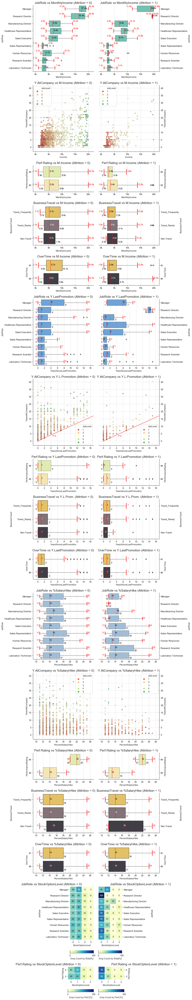

In [15]:
figRemun_all = fPlots.f_Remuneration_analysis(df)
plt.show(figRemun_all)

<a class="anchor" id="remun-ki"></a>
<b>Key Insights</b>:
   > <p> There are no observable differences in the monthly income in both groups. </p>
   > <p> Another interesting insight when comparing the Performance Rating and the income is that, in the "Attrition" group, employees with 4 in performance earns in general less than the ones with 3. This does not occur in the "No Attrition" group. </p>
   > <p> In the same way, while on the "Attrition" group, frequent travellers are the ones that earn lower income, in the "No Attrition", are the ones that earn more.  </p>
   > <p> Similarly, in the group of employees with no attrition, the employees that work over time earn more. However, in general, employees that show some attrition and work over time earn less than the ones that do not do it.</p>
   > <p> There is no major insight gathered when comparing Job Role and years since last promotion. </p>
   > <p> Employees with attrition register lower salary hikes than the other group. </p>
   > <p> The Stock Option Level in the employees with some attrition is way lower. </p>

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="rates"></a>
#### 2.3.6: Rates

What are rates? Are there any patterns relating the rates and the `Attrition`?

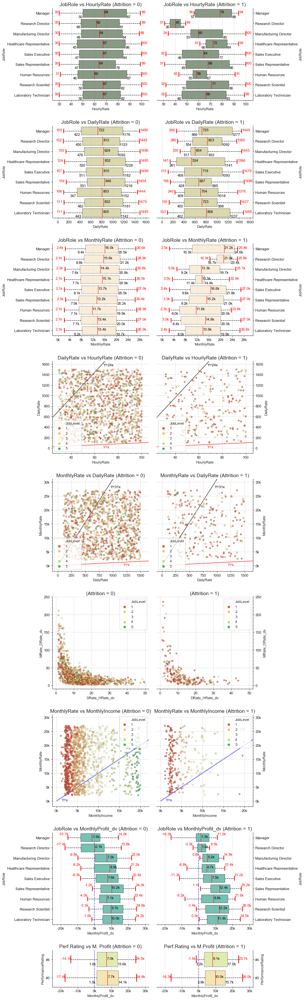

In [16]:
figRates_all = fPlots.f_Rate_analysis(df)
plt.show(figRates_all)

<a class="anchor" id="rates-ki"></a>
<b>Key Insights</b>:
   > <p> In terms of monthly profits and monthly rates, the employees from the "Attrition" group represent the higher values, which means these employees are the ones that are more profitable to the company. </p>

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="verify-data-quality"></a>
### 2.4: Verify the data quality

Are there any missing values on the data? And missclassifications? What about outliers?

In [17]:
# Check for duplicates in the data
np.shape(df['EmployeeNumber'].unique())[0]

1470

In [18]:
# Inspect the records where NumCompaniesWorked = 0
df[(df['NumCompaniesWorked'] == 0)][['EmployeeNumber', 'JobRole', 'TotalWorkingYears', 'YearsAtCompany']].head(n = 10)

,EmployeeNumber,JobRole,TotalWorkingYears,YearsAtCompany
5,8,Laboratory Technician,8,7
8,12,Manufacturing Director,10,9
10,14,Laboratory Technician,6,5
11,15,Laboratory Technician,10,9
13,18,Laboratory Technician,3,2
16,21,Research Scientist,7,6
20,26,Manufacturing Director,5,4
22,28,Research Director,13,12
27,35,Sales Executive,10,9
46,60,Sales Executive,10,9


In [19]:
df[(df['NumCompaniesWorked'] == 0)]['EmployeeNumber'].count()

197

In [20]:
df[(df['NumCompaniesWorked'] == 0) & (df['TotalWorkingYears'] == 0)]['EmployeeNumber'].count()

0

<a class="anchor" id="dataquality-ki"></a>
<b>Key Insights</b>:


   >- <u>Missing Data</u>: No missing values were observed on the data.
   > 
   >   
   >- <u>Data Consistency</u>: Following on the analysis from the plots above it is possible to observe:
    <p>`YearsAtCompany_TotalWorkingYears_dv` vs `NumCompaniesWorked`: There are 197 records of employees with a zero value at the NumCompaniesWorked despite being already working at the company for several years!</p>
   >
   >
   >
   >- <u>Outliers</u> (considering an IQR of 3):
    <p>Even though it was possible to identify some outliers (depending on the variables selected), no relevant patterns were observed that lead us to make further analysis at this point.</p>

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="data-preparation"></a>
# 3. Data Preparation
<a class="anchor" id="clean-the-data"></a>
### 3.1: Clean the data

<a class="anchor" id="inconsistent-records"></a>
#### 3.1.1: Fix inconsistent records

- `YearsAtCompany_TotalWorkingYears_dv` vs `NumCompaniesWorked`

In [21]:
df_treated = df.copy()
nrecords_original = np.shape(df_treated)[0]
df_treated['NumCompaniesWorked'] = df_treated.apply(lambda row: 1 if row['NumCompaniesWorked'] == 0 \
                                                  else row['NumCompaniesWorked'], axis = 1)


df_treated['NumCompWork_TotalWorkY_dv'] = df_treated.apply(lambda row: df_treated['NumCompWork_TotalWorkY_dv'].max() if row['TotalWorkingYears'] == 0 \
                                                  else row['NumCompaniesWorked'] / row['TotalWorkingYears'], axis = 1)


df_treated['YAtCompany_TotalWorkY_dv'] = df_treated.apply(lambda row: df_treated['YAtCompany_TotalWorkY_dv'].max() if row['TotalWorkingYears'] == 0 \
                                                  else row['YearsAtCompany'] / row['TotalWorkingYears'], axis = 1)



[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="transform-the-data"></a>
### 3.2: Transform the data

<a class="anchor" id="transform-normality"></a>
#### 3.2.1: Transformations to archieve "normality"

Are these transformations required?

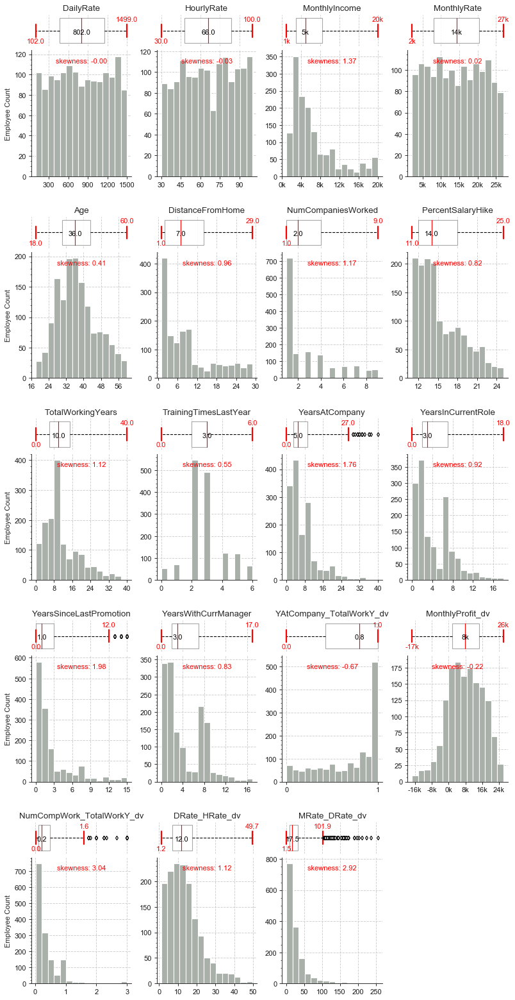

In [22]:
figure_hist_box = fPlots.f_hist_box(df_treated, RatioVars, 4, '#A9B0A9')
plt.show(figure_hist_box)

In [23]:
# Use Box-Cox Transformations (the lambda coefficients were obtained by searching 
# the one that maximizes the log-likelihood function)
TransformVars = ['MonthlyIncome', 'Age','DistanceFromHome', 'NumCompaniesWorked', 'PercentSalaryHike',\
                 'TotalWorkingYears', 'TrainingTimesLastYear', 'YearsAtCompany', 'YearsInCurrentRole',\
                 'YearsSinceLastPromotion', 'YearsWithCurrManager', 'DRate_HRate_dv', 'MRate_DRate_dv',\
                 'YAtCompany_TotalWorkY_dv', 'NumCompWork_TotalWorkY_dv'
                ]

lmbda_list = []
for index, item in enumerate(TransformVars):
    var_aux = eval('df_treated[' + '\'' + item + '\'' + ']') + .0001
    boxcox_out = sp.stats.boxcox(var_aux)
    if((boxcox_out[1] > 3.0) or (boxcox_out[1] < -3.0)):
        lmbda_list.append(1)
    else:
        lmbda_list.append(boxcox_out[1])
#lmbda_list

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:902: RuntimeWarning: divide by zero encountered in log
  llf -= N / 2.0 * np.log(np.sum((y - y_mean)**2. / N, axis=0))
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\optimize.py:2315: RuntimeWarning: invalid value encountered in double_scalars
  w = xb - ((xb - xc) * tmp2 - (xb - xa) * tmp1) / denom
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\optimize.py:1933: RuntimeWarning: invalid value encountered in double_scalars
  tmp1 = (x - w) * (fx - fv)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\optimize.py:1934: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (x - v) * (fx - fw)
C:\ProgramData\Anaconda3\lib\site-packages\scipy\optimize\optimize.py:1935: RuntimeWarning: invalid value encountered in double_scalars
  p = (x - v) * tmp2 - (x - w) * tmp1


In [24]:
lmbda_list[0] = -.2
for index, item in enumerate(TransformVars):
    var_aux = eval('df_treated[' + '\'' + item + '\'' + ']') + .0001
    lmbda = '{:.3f}'.format(lmbda_list[index])
    exec('df_treated.loc[:, ' + '\'' + item + '_z' + '\'' + '] = var_aux.map(lambda x: (x**' + lmbda +\
     ' - 1) / ' + lmbda + ')')
TransformedVars = [var + '_z' for var in TransformVars]

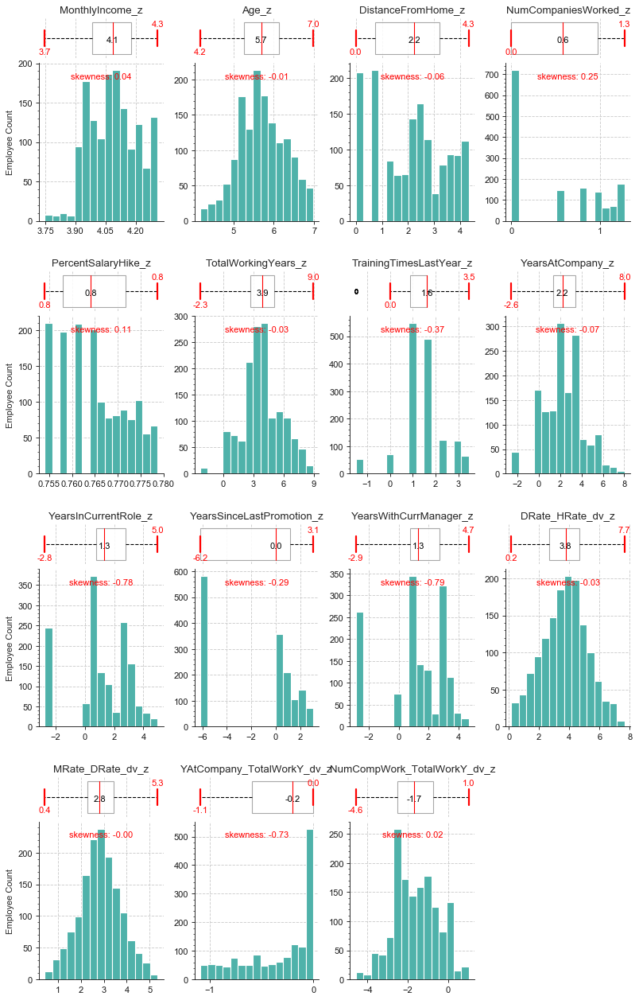

In [25]:
figure_hist_box = fPlots.f_hist_box(df_treated, TransformedVars, 4, '#4fb2aa')
plt.show(figure_hist_box)

In [26]:
# inspect the records where it was oberved a relevant spike on the most left side
test = df_treated[df_treated['NumCompaniesWorked_z'] <= .5]
print(test['NumCompaniesWorked'].describe())
print(df_treated[df_treated['NumCompaniesWorked'] == 1]['EmployeeNumber'].count())

count   718.0000
mean      1.0000
std       0.0000
min       1.0000
25%       1.0000
50%       1.0000
75%       1.0000
max       1.0000
Name: NumCompaniesWorked, dtype: float64
718


This spike corresponds to all the records with one in `NumCompaniesWorked` which is statistically significant and, therefore, a flag variable will be created to cover those records.

In [27]:
# inspect the records where it was oberved a relevant spike on the most left side
test = df_treated[df_treated['YearsInCurrentRole_z'] <= 0]
print(test['YearsInCurrentRole'].describe())
print(df_treated[df_treated['YearsInCurrentRole'] == 0]['EmployeeNumber'].count())

count   244.0000
mean      0.0000
std       0.0000
min       0.0000
25%       0.0000
50%       0.0000
75%       0.0000
max       0.0000
Name: YearsInCurrentRole, dtype: float64
244


This spike corresponds to all the records with zero in `YearsInCurrentRole` which is statistically significant and, therefore, a flag variable will be created to cover those records.

In [28]:
# inspect the records where it was oberved a relevant spike on the most left side
test = df_treated[df_treated['YearsSinceLastPromotion_z'] <= 0]
print(test['YearsSinceLastPromotion'].describe())
print(df_treated[df_treated['YearsSinceLastPromotion'] == 0]['EmployeeNumber'].count())

count   581.0000
mean      0.0000
std       0.0000
min       0.0000
25%       0.0000
50%       0.0000
75%       0.0000
max       0.0000
Name: YearsSinceLastPromotion, dtype: float64
581


This spike corresponds to all the records with zero in `YearsSinceLastPromotion` which is statistically significant and, therefore, a flag variable will be created to cover those records.

In [29]:
# inspect the records where it was oberved a relevant spike on the most left side
test = df_treated[df_treated['YearsWithCurrManager_z'] <= 0]
print(test['YearsWithCurrManager'].describe())
print(df_treated[df_treated['YearsWithCurrManager'] == 0]['EmployeeNumber'].count())

count   263.0000
mean      0.0000
std       0.0000
min       0.0000
25%       0.0000
50%       0.0000
75%       0.0000
max       0.0000
Name: YearsWithCurrManager, dtype: float64
263


This spike corresponds to all the records with zero in `YearsWithCurrManager` which is statistically significant and, therefore, a flag variable will be created to cover those records.

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="flag-variables"></a>
#### 3.2.2: Create flag variables

- Nominal Variables

In [30]:
# BusinessTravel
list_bin = [1 if value == 'Non-Travel' else 0 for value in eval('df_treated[' + '\'' + 'BusinessTravel' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'BT_Non-Travel_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Travel_Frequently' else 0 for value in eval('df_treated[' + '\'' + 'BusinessTravel' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'BT_Travel_Frequently_flag' + '\'' + '] = list_bin')


# Department
list_bin = [1 if value == 'Sales' else 0 for value in eval('df_treated[' + '\'' + 'Department' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'Dep_Sales_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Human Resources' else 0 for value in eval('df_treated[' + '\'' + 'Department' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'Dep_HR_flag' + '\'' + '] = list_bin')


# EducationField
list_bin = [1 if value == 'Human Resources' else 0 for value in eval('df_treated[' + '\'' + 'EducationField' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'Educ_HR_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Marketing' else 0 for value in eval('df_treated[' + '\'' + 'EducationField' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'Educ_Marketing_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Medical' else 0 for value in eval('df_treated[' + '\'' + 'EducationField' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'Educ_Medical_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Life Sciences' else 0 for value in eval('df_treated[' + '\'' + 'EducationField' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'Educ_LifeSciences_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Technical Degree' else 0 for value in eval('df_treated[' + '\'' + 'EducationField' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'Educ_TechDegree_flag' + '\'' + '] = list_bin')


# Gender
list_bin = [1 if value == 'Female' else 0 for value in eval('df_treated[' + '\'' + 'Gender' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'Gender_Female_flag' + '\'' + '] = list_bin')


# JobRole
list_bin = [1 if value == 'Laboratory Technician' else 0 for value in eval('df_treated[' + '\'' + 'JobRole' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JR_LabTech_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Research Scientist' else 0 for value in eval('df_treated[' + '\'' + 'JobRole' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JR_ResrchScist_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Human Resources' else 0 for value in eval('df_treated[' + '\'' + 'JobRole' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JR_HR_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Sales Representative' else 0 for value in eval('df_treated[' + '\'' + 'JobRole' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JR_SalesRep_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Sales Executive' else 0 for value in eval('df_treated[' + '\'' + 'JobRole' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JR_SalesExec_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Healthcare Representative' else 0 for value in eval('df_treated[' + '\'' + 'JobRole' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JR_HealthcareRep_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Manufacturing Director' else 0 for value in eval('df_treated[' + '\'' + 'JobRole' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JR_ManufctDirec_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Research Director' else 0 for value in eval('df_treated[' + '\'' + 'JobRole' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JR_ResearchDirec_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Manager' else 0 for value in eval('df_treated[' + '\'' + 'JobRole' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JR_Manager_flag' + '\'' + '] = list_bin')

# MaritalStatus
list_bin = [1 if value == 'Single' else 0 for value in eval('df_treated[' + '\'' + 'MaritalStatus' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'MS_Single_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 'Married' else 0 for value in eval('df_treated[' + '\'' + 'MaritalStatus' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'MS_Married_flag' + '\'' + '] = list_bin')

# Rename the dummy variables (already available)
df_treated.rename(columns={'OverTime': 'OverTime_flag', 'Attrition': 'Attrition_flag'}, inplace=True)

- Ordinal Variables

We chose to explode the ordinal variables into their corresponding flag variables instead of treating them as numerical since the distances between their values are not really known and, therefore, could be misleading for the models that could be confused by the scale.

In [31]:
# Education
list_bin = [1 if (value <= 2) else 0 for value in eval('df_treated[' + '\'' + 'Education' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'Educ_low_flag' + '\'' + '] = list_bin')


# WorkLifeBalance
#list_bin = [1 if (value <= 2) else 0 for value in eval('df_treated[' + '\'' + 'WorkLifeBalance' + '\'' + ']')]
#exec('df_treated.loc[:, ' + '\'' + 'WLBalance_low_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 1 else 0 for value in eval('df_treated[' + '\'' + 'WorkLifeBalance' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'WLBalance_1_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 2 else 0 for value in eval('df_treated[' + '\'' + 'WorkLifeBalance' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'WLBalance_2_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 3 else 0 for value in eval('df_treated[' + '\'' + 'WorkLifeBalance' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'WLBalance_3_flag' + '\'' + '] = list_bin')



# EnvironmentSatisfaction
list_bin = [1 if value == 1 else 0 for value in eval('df_treated[' + '\'' + 'EnvironmentSatisfaction' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'EnvSatisf_1_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 2 else 0 for value in eval('df_treated[' + '\'' + 'EnvironmentSatisfaction' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'EnvSatisf_2_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 4 else 0 for value in eval('df_treated[' + '\'' + 'EnvironmentSatisfaction' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'EnvSatisf_4_flag' + '\'' + '] = list_bin')


# JobInvolvement
list_bin = [1 if value == 1 else 0 for value in eval('df_treated[' + '\'' + 'JobInvolvement' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JInvolv_1_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 2 else 0 for value in eval('df_treated[' + '\'' + 'JobInvolvement' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JInvolv_2_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 4 else 0 for value in eval('df_treated[' + '\'' + 'JobInvolvement' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JInvolv_4_flag' + '\'' + '] = list_bin')


# RelationshipSatisfaction
list_bin = [1 if value == 1 else 0 for value in eval('df_treated[' + '\'' + 'RelationshipSatisfaction' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'RelSatisf_1_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 2 else 0 for value in eval('df_treated[' + '\'' + 'RelationshipSatisfaction' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'RelSatisf_2_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 4 else 0 for value in eval('df_treated[' + '\'' + 'RelationshipSatisfaction' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'RelSatisf_4_flag' + '\'' + '] = list_bin')


# JobSatisfaction
list_bin = [1 if value == 1 else 0 for value in eval('df_treated[' + '\'' + 'JobSatisfaction' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JobSatisf_1_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 2 else 0 for value in eval('df_treated[' + '\'' + 'JobSatisfaction' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JobSatisf_2_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 4 else 0 for value in eval('df_treated[' + '\'' + 'JobSatisfaction' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JobSatisf_4_flag' + '\'' + '] = list_bin')



# JobLevel
list_bin = [1 if value == 1 else 0 for value in eval('df_treated[' + '\'' + 'JobLevel' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JL_1_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 2 else 0 for value in eval('df_treated[' + '\'' + 'JobLevel' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JL_2_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 3 else 0 for value in eval('df_treated[' + '\'' + 'JobLevel' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JL_3_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 4 else 0 for value in eval('df_treated[' + '\'' + 'JobLevel' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'JL_4_flag' + '\'' + '] = list_bin')


# PerformanceRating
list_bin = [1 if value == 3 else 0 for value in eval('df_treated[' + '\'' + 'PerformanceRating' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'PerfRating_3_flag' + '\'' + '] = list_bin')


# StockOptionLevel
list_bin = [1 if value == 0 else 0 for value in eval('df_treated[' + '\'' + 'StockOptionLevel' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'StockOpt_0_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 1 else 0 for value in eval('df_treated[' + '\'' + 'StockOptionLevel' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'StockOpt_1_flag' + '\'' + '] = list_bin')

list_bin = [1 if value == 2 else 0 for value in eval('df_treated[' + '\'' + 'StockOptionLevel' + '\'' + ']')]
exec('df_treated.loc[:, ' + '\'' + 'StockOpt_2_flag' + '\'' + '] = list_bin')

- Transformed Variables

In [32]:
# Create flag variables for the Transformed Variables (whenever required based on the previous analysis)
var_list = ['NumCompaniesWorked_z', 'YearsInCurrentRole_z', 'YearsSinceLastPromotion_z', 'YearsWithCurrManager_z']
ref_value = [.5, 0, 0 ,0]
for index, item in enumerate(var_list):
    list_bin = []
    list_bin = [1 if value <= ref_value[index] else 0 for value in eval('df_treated[' + '\'' + item + '\'' + ']')]
    exec('df_treated.loc[:, ' + '\'' + item.split('_')[0] + '_0_flag' + '\'' + '] = list_bin')

In [33]:
df_treated[df_treated.columns[pd.Series(df_treated.columns).str.contains('flag')]].describe().T

,count,mean,std,min,25%,50%,75%,max
Attrition_flag,1470.0000,0.1612,0.3679,0.0000,0.0000,0.0000,0.0000,1.0000
OverTime_flag,1470.0000,0.2830,0.4506,0.0000,0.0000,0.0000,1.0000,1.0000
BT_Non-Travel_flag,1470.0000,0.1020,0.3028,0.0000,0.0000,0.0000,0.0000,1.0000
BT_Travel_Frequently_flag,1470.0000,0.1884,0.3912,0.0000,0.0000,0.0000,0.0000,1.0000
Dep_Sales_flag,1470.0000,0.3034,0.4599,0.0000,0.0000,0.0000,1.0000,1.0000
Dep_HR_flag,1470.0000,0.0429,0.2026,0.0000,0.0000,0.0000,0.0000,1.0000
Educ_HR_flag,1470.0000,0.0184,0.1343,0.0000,0.0000,0.0000,0.0000,1.0000
Educ_Marketing_flag,1470.0000,0.1082,0.3107,0.0000,0.0000,0.0000,0.0000,1.0000
Educ_Medical_flag,1470.0000,0.3156,0.4649,0.0000,0.0000,0.0000,1.0000,1.0000
Educ_LifeSciences_flag,1470.0000,0.4122,0.4924,0.0000,0.0000,0.0000,1.0000,1.0000


[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="normalize-the-data"></a>
#### 3.2.3: Normalize the data

In [34]:
# Assign the columns to apply the normalization (not covered before with transformations)
df_treated = df_treated.assign(DailyRate_z = df_treated['DailyRate'].values)
df_treated = df_treated.assign(HourlyRate_z = df_treated['HourlyRate'].values)
df_treated = df_treated.assign(MonthlyRate_z = df_treated['MonthlyRate'].values)
df_treated = df_treated.assign(MonthlyProfit_dv_z = df_treated['MonthlyProfit_dv'].values)

df_treated_z = df_treated[df_treated.columns[pd.Series(df_treated.columns).str.contains('_z')]]

In [35]:
# Apply the Min-Max Normalization
df_treated_z = df_treated_z.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)))

In [36]:
df_treated[df_treated.columns[pd.Series(df_treated.columns).str.contains('_z')]] = df_treated_z

In [37]:
df_treated[df_treated.columns[pd.Series(df_treated.columns).str.contains('_z')]].describe().T

,count,mean,std,min,25%,50%,75%,max
MonthlyIncome_z,1470.0000,0.6064,0.2110,0.0000,0.4246,0.6038,0.7675,1.0000
Age_z,1470.0000,0.5418,0.2109,0.0000,0.3892,0.5401,0.6937,1.0000
DistanceFromHome_z,1470.0000,0.4813,0.3116,0.0000,0.1685,0.5187,0.7412,1.0000
NumCompaniesWorked_z,1470.0000,0.3801,0.3936,0.0000,0.0000,0.4519,0.7606,1.0000
PercentSalaryHike_z,1470.0000,0.4420,0.2963,0.0000,0.1612,0.4067,0.7174,1.0000
TotalWorkingYears_z,1470.0000,0.5447,0.1761,0.0000,0.4426,0.5514,0.6564,1.0000
TrainingTimesLastYear_z,1470.0000,0.5837,0.1968,0.0000,0.4808,0.6300,0.6300,1.0000
YearsAtCompany_z,1470.0000,0.4663,0.1740,0.0000,0.3708,0.4515,0.5657,1.0000
YearsInCurrentRole_z,1470.0000,0.5056,0.2636,0.0000,0.4584,0.5300,0.7163,1.0000
YearsSinceLastPromotion_z,1470.0000,0.4664,0.3860,0.0000,0.0000,0.6677,0.7925,1.0000


In [38]:
df_treated_norm = pd.concat([df_treated[df_treated.columns[pd.Series(df_treated.columns).str.contains('_z')]], df_treated[df_treated.columns[pd.Series(df_treated.columns).str.contains('flag')]]], axis = 1)
df_treated_norm.to_csv('df_treated_norm.csv', sep = '\t', index = False)

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="select-the-data"></a>
### 3.3: Select the data

<a class="anchor" id="select-corr"></a>
#### 3.3.1: Correlation Matrix for Ratio Variables

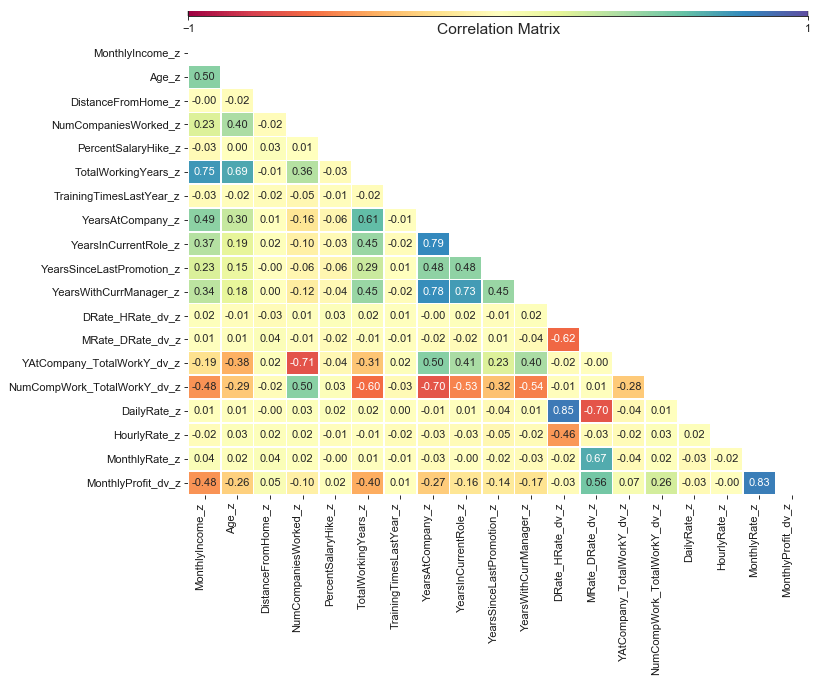

In [39]:
figure_CorrelMatrix = fPlots.f_CorrMatrix(\
                        df_treated[df_treated.columns[pd.Series(df_treated.columns).str.contains('_z')]].corr(),\
                                          10, 8, 10)
plt.show(figure_CorrelMatrix)

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition"></a>
#### 3.3.2: Clustering Analysis (Interpreting Attrition)

In [40]:
# Import the required libraries
from sklearn.cluster import KMeans

In [41]:
df_attrition = df_treated[df_treated['Attrition_flag'] == 1]

<a class="anchor" id="clustering_attrition_who"></a>
##### 3.3.2.1: Who are the employees in attrition (based on JobRole)?

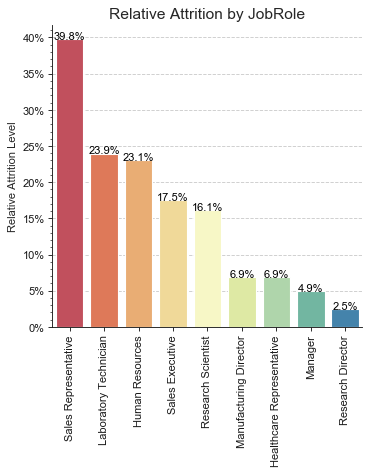

In [42]:
JobRole_idx = df_treated['JobRole'].unique()
per_JobRole_Attrition_1 = []
for JR in JobRole_idx:
    per_JobRole_Attrition_1.append((df_treated[(df_treated['JobRole']==JR) & \
           (df_treated['Attrition_flag'] == 1)]['EmployeeNumber'].count()) / (df_treated[(df_treated['JobRole']==JR)]\
                                                                              ['EmployeeNumber'].count()))
    
Attrition_JobRole = pd.Series(per_JobRole_Attrition_1, index = JobRole_idx, name = 'AttritionbyJobRole').\
sort_values(ascending = False)

figure_CorrelMatrix = fPlots.f_Attrition_JobRole(Attrition_JobRole)
plt.show(figure_CorrelMatrix)

<a class="anchor" id="clustering_attrition_who-ki"></a>
<b>Key Insights</b>:


   >- The Sales Representative have a considerable number of employees in attrition (around 40%).
   >- JobRoles as Laboratory Technician, Human Resources, Sales Executive and Research Scientist still have a relevant attrition level among their employees (over 16%).
   >- JobRoles more associated to management functions in the company such as Manufacturing Director, Manager and Research Director have a relative employee attrition that is comparatively much lower. The Healthcare Representative also have a low attrition level among their employees.

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition_drivers"></a>
##### 3.3.2.2: What are the drivers for employee attrition (based on JobRole)? 

<a class="anchor" id="clustering_attrition_drivers_SR"></a>
##### 3.3.2.2.1: Sales Representative

In [43]:
df_SR = df_treated[df_treated['JobRole'] == 'Sales Representative'].copy()

Variable selection: `Attrition_flag`

In [44]:
vars_clustering = ['Attrition_flag']

In [45]:
df_KMeans_SR = df_SR[vars_clustering].copy()

In [46]:
n_clusters = 2

# Create a KMeans instance with k clusters: model
model = KMeans(n_clusters = n_clusters, n_init = 50, precompute_distances = True, max_iter = 500)

# Fit model to samples
model.fit(df_KMeans_SR)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
       n_clusters=2, n_init=50, n_jobs=None, precompute_distances=True,
       random_state=None, tol=0.0001, verbose=0)

In [47]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_SR = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_SR.fit(df_KMeans_SR)

del df_KMeans_SR # drop auxiliary dataframe to perfom the clustering

In [48]:
centroids = pd.DataFrame(model_KMeans_SR.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1
Attrition_flag,0.0000,1.0000


In [49]:
# assign the cluster labels to the dataframe
df_SR['cluster_SR'] = model_KMeans_SR.labels_

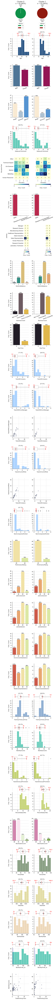

In [50]:
figClusterInt_cluster_SR = fPlots.f_cluster_interpretation(n_clusters, df_SR, 'cluster_SR')
plt.show(figClusterInt_cluster_SR)

<a class="anchor" id="clustering_attrition_drivers_SR-ki"></a>
<b>Key Insights</b>:
   ><p><b>Major Drivers</b>: BusinessTravel, OverTime, MonthlyIncome, YearsAtCompany, YearsWithCurrManager</p>
   >
   >- The Sales Representative's employees in attrition, comparatively, do more overtime and they also travel a lot. The overtime doesn't seem to be related with employee performance (it could suggest lack of skills or poor time management from the employees).
   >
   >- It is also important to notice that all the employees that don’t travel, aren’t in attrition which suggests that traveling is an important way to start having attrition.
   >
   >- Most employees in attrition leave the company within the first two years with their current managers.
   >
   >- Additionally, in average, their income is less than the employees that aren’t in attrition (the median is 1k inferior for the employees in attrition).

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition_drivers_LT"></a>
##### 3.3.2.2.2: Laboratory Technician

In [51]:
df_LT = df_treated[df_treated['JobRole'] == 'Laboratory Technician'].copy()

Variable selection: `Attrition_flag`

In [52]:
vars_clustering = ['Attrition_flag']

In [53]:
df_KMeans_LT = df_LT[vars_clustering].copy()

In [54]:
n_clusters = 2

# Create a KMeans instance with k clusters: model
model = KMeans(n_clusters = n_clusters, n_init = 50, precompute_distances = True, max_iter = 500)

# Fit model to samples
model.fit(df_KMeans_LT)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
       n_clusters=2, n_init=50, n_jobs=None, precompute_distances=True,
       random_state=None, tol=0.0001, verbose=0)

In [55]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_LT = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_LT.fit(df_KMeans_LT)

del df_KMeans_LT # drop auxiliary dataframe to perfom the clustering

In [56]:
centroids = pd.DataFrame(model_KMeans_LT.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1
Attrition_flag,0.0000,1.0000


In [57]:
# assign the cluster labels to the dataframe
df_LT['cluster_LT'] = model_KMeans_LT.labels_

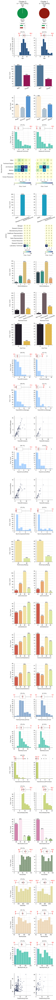

In [58]:
figClusterInt_cluster_LT = fPlots.f_cluster_interpretation(n_clusters, df_LT, 'cluster_LT')
plt.show(figClusterInt_cluster_LT)

<a class="anchor" id="clustering_attrition_drivers_LT-ki"></a>
<b>Key Insights</b>:
   ><p><b>Major Drivers</b>: WorkLifeBalance, OverTime, YearsAtCompany, StockOptionLevel</p>
   >
   >- The Laboratory Technician's employees in attrition, comparatively, do more overtime and have a lower work life balance. Again, the overtime doesn't seem to be related with employee performance.    
   >
   >- They also have less years in the company (mostly lower than 10) and they are younger.
   >
   >- The income doesn't seem to be a decisive factor influencing the attrition for these employees. On the other way, the stock option level seems to be relevant in terms of attrition, since the employees in attrition have lower stock option levels (60% doesn’t have any stock option level at all).

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition_drivers_HR"></a>
##### 3.3.2.2.3: Human Resources

In [59]:
df_HR = df_treated[df_treated['JobRole'] == 'Human Resources'].copy()

Variable selection: `Attrition_flag`

In [60]:
vars_clustering = ['Attrition_flag']

In [61]:
df_KMeans_HR = df_HR[vars_clustering].copy()

In [62]:
n_clusters = 2

# Create a KMeans instance with k clusters: model
model = KMeans(n_clusters = n_clusters, n_init = 50, precompute_distances = True, max_iter = 500)

# Fit model to samples
model.fit(df_KMeans_HR)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
       n_clusters=2, n_init=50, n_jobs=None, precompute_distances=True,
       random_state=None, tol=0.0001, verbose=0)

In [63]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_HR = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_HR.fit(df_KMeans_HR)

del df_KMeans_HR # drop auxiliary dataframe to perfom the clustering

In [64]:
centroids = pd.DataFrame(model_KMeans_HR.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1
Attrition_flag,1.0000,0.0000


In [65]:
# assign the cluster labels to the dataframe
df_HR['cluster_HR'] = model_KMeans_HR.labels_

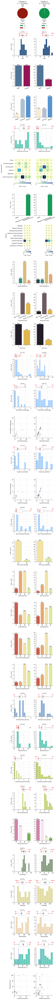

In [66]:
figClusterInt_cluster_HR = fPlots.f_cluster_interpretation(n_clusters, df_HR, 'cluster_HR')
plt.show(figClusterInt_cluster_HR)

<a class="anchor" id="clustering_attrition_drivers_HR-ki"></a>
<b>Key Insights</b>:
   ><p><b>Major Drivers</b>: DistanceFromHome, BusinessTravel, OverTime, YearsAtCompany, YearsWithCurrManager, MonthlyIncome</p>
   >
   >- The Human Resource’s employees in attrition, comparatively, live further apart from the work, they do travel a little bit more frequently and do more overtime.
   >
   >- Again, it is also important to notice that all the employees that don’t travel, aren’t in attrition.
   >
   >- They also have less years in the company (mostly lower than 7) and they are younger.
   >
   >- Most employees in attrition leave the company within the first two years with their current managers.
   >
   >- Additionally, in average, their income is less than the employees that aren’t in attrition (the median is 1k inferior for the employees in attrition).
   >
   >- It is also worth mentioning that most of the employees with highest performance rating are not in attrition.

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition_drivers_SE"></a>
##### 3.3.2.2.4: Sales Executive

In [67]:
df_SE = df_treated[df_treated['JobRole'] == 'Sales Executive'].copy()

Variable selection: `Attrition_flag`

In [68]:
vars_clustering = ['Attrition_flag']

In [69]:
df_KMeans_SE = df_SE[vars_clustering].copy()

In [70]:
n_clusters = 2

# Create a KMeans instance with k clusters: model
model = KMeans(n_clusters = n_clusters, n_init = 50, precompute_distances = True, max_iter = 500)

# Fit model to samples
model.fit(df_KMeans_SE)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
       n_clusters=2, n_init=50, n_jobs=None, precompute_distances=True,
       random_state=None, tol=0.0001, verbose=0)

In [71]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_SE = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_SE.fit(df_KMeans_SE)

del df_KMeans_SE # drop auxiliary dataframe to perfom the clustering

In [72]:
centroids = pd.DataFrame(model_KMeans_SE.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1
Attrition_flag,0.0000,1.0000


In [73]:
# assign the cluster labels to the dataframe
df_SE['cluster_SE'] = model_KMeans_SE.labels_

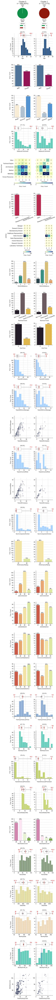

In [74]:
figClusterInt_cluster_SE = fPlots.f_cluster_interpretation(n_clusters, df_SE, 'cluster_SE')
plt.show(figClusterInt_cluster_SE)

<a class="anchor" id="clustering_attrition_drivers_SE-ki"></a>
<b>Key Insights</b>:
   ><p><b>Major Drivers</b>: DistanceFromHome, OverTime, BusinessTravel, NumCompaniesWorked, StockOptionLevel</p>
   >
   >- The Sales Executive's employees in attrition, comparatively, live a little further apart from the work and they do more overtime.
   >
   >- They do have worked in more companies (with a median of 4) which could be flagged as they are more open to move between companies.
   >
   >- The income doesn't seem to be a decisive factor influencing the attrition for these employees (the ones that are leaving have a median income 1k higher). On the other way, the stock option level seems to be relevant in terms of attrition, since the employees in attrition have lower stock option levels (70% doesn’t have any stock option level at all).

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition_drivers_RS"></a>
##### 3.3.2.2.5 Research Scientist

In [75]:
df_RS = df_treated[df_treated['JobRole'] == 'Research Scientist'].copy()

Variable selection: `Attrition_flag`

In [76]:
vars_clustering = ['Attrition_flag']

In [77]:
df_KMeans_RS = df_RS[vars_clustering].copy()

In [78]:
n_clusters = 2

# Create a KMeans instance with k clusters: model
model = KMeans(n_clusters = n_clusters, n_init = 50, precompute_distances = True, max_iter = 500)

# Fit model to samples
model.fit(df_KMeans_RS)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
       n_clusters=2, n_init=50, n_jobs=None, precompute_distances=True,
       random_state=None, tol=0.0001, verbose=0)

In [79]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_RS = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_RS.fit(df_KMeans_RS)

del df_KMeans_RS # drop auxiliary dataframe to perfom the clustering

In [80]:
centroids = pd.DataFrame(model_KMeans_RS.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1
Attrition_flag,-0.0000,1.0000


In [81]:
# assign the cluster labels to the dataframe
df_RS['cluster_RS'] = model_KMeans_RS.labels_

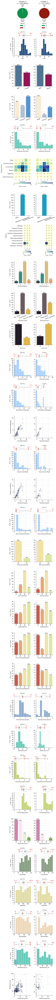

In [82]:
figClusterInt_cluster_RS = fPlots.f_cluster_interpretation(n_clusters, df_RS, 'cluster_RS')
plt.show(figClusterInt_cluster_RS)

<a class="anchor" id="clustering_attrition_drivers_RS-ki"></a>
<b>Key Insights</b>:
   ><p><b>Major Drivers</b>: BusinessTravel, OverTime, TotalWorkingYears, MonthlyIncome</p>
   >
   >- The Research Scientist's employees in attrition, comparatively, do more overtime and they also travel more frequently.
   >
   >- They also have less total working years and they are slightly younger.
   >
   >- Additionally, in average, their income is less than the employees that aren’t in attrition (the median is 1k inferior for the employees in attrition).

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition_drivers_MD"></a>
##### 3.3.2.2.6 Manufacturing Director

In [83]:
df_MD = df_treated[df_treated['JobRole'] == 'Manufacturing Director'].copy()

Variable selection: `Attrition_flag`

In [84]:
vars_clustering = ['Attrition_flag']

In [85]:
df_KMeans_MD = df_MD[vars_clustering].copy()

In [86]:
n_clusters = 2

# Create a KMeans instance with k clusters: model
model = KMeans(n_clusters = n_clusters, n_init = 50, precompute_distances = True, max_iter = 500)

# Fit model to samples
model.fit(df_KMeans_MD)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
       n_clusters=2, n_init=50, n_jobs=None, precompute_distances=True,
       random_state=None, tol=0.0001, verbose=0)

In [87]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_MD = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_MD.fit(df_KMeans_MD)

del df_KMeans_MD # drop auxiliary dataframe to perfom the clustering

In [88]:
centroids = pd.DataFrame(model_KMeans_MD.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1
Attrition_flag,0.0000,1.0000


In [89]:
# assign the cluster labels to the dataframe
df_MD['cluster_MD'] = model_KMeans_MD.labels_

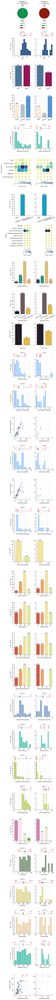

In [90]:
figClusterInt_cluster_MD = fPlots.f_cluster_interpretation(n_clusters, df_MD, 'cluster_MD')
plt.show(figClusterInt_cluster_MD)

<a class="anchor" id="clustering_attrition_drivers_MD-ki"></a>
<b>Key Insights</b>:
   >- Despite the employees in attrition for this Job Role are not representative (only 10 out of 145), all that have the highest performance rating are not leaving the company.

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition_drivers_HRep"></a>
##### 3.3.2.2.7 Healthcare Representative

In [91]:
df_HRep = df_treated[df_treated['JobRole'] == 'Healthcare Representative'].copy()

Variable selection: `Attrition_flag`

In [92]:
vars_clustering = ['Attrition_flag']

In [93]:
df_KMeans_HRep = df_HRep[vars_clustering].copy()

In [94]:
n_clusters = 2

# Create a KMeans instance with k clusters: model
model = KMeans(n_clusters = n_clusters, n_init = 50, precompute_distances = True, max_iter = 500)

# Fit model to samples
model.fit(df_KMeans_HRep)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
       n_clusters=2, n_init=50, n_jobs=None, precompute_distances=True,
       random_state=None, tol=0.0001, verbose=0)

In [95]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_HRep = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_HRep.fit(df_KMeans_HRep)

del df_KMeans_HRep # drop auxiliary dataframe to perfom the clustering

In [96]:
centroids = pd.DataFrame(model_KMeans_HRep.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1
Attrition_flag,-0.0000,1.0000


In [97]:
# assign the cluster labels to the dataframe
df_HRep['cluster_HRep'] = model_KMeans_HRep.labels_

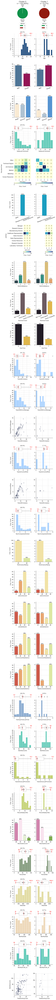

In [98]:
figClusterInt_cluster_HRep = fPlots.f_cluster_interpretation(n_clusters, df_HRep, 'cluster_HRep')
plt.show(figClusterInt_cluster_HRep)

<a class="anchor" id="clustering_attrition_drivers_HRep-ki"></a>
<b>Key Insights</b>:
   >- Despite the employees in attrition for this Job Role are not representative (only 9 out of 131), they do live further apart from work. The income doesn’t seem to be a decisive factor influencing the attrition for these employees.

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition_drivers_M"></a>
##### 3.3.2.2.8 Manager

In [99]:
df_M = df_treated[df_treated['JobRole'] == 'Manager'].copy()

Variable selection: `Attrition_flag`

In [100]:
vars_clustering = ['Attrition_flag']

In [101]:
df_KMeans_M = df_M[vars_clustering].copy()

In [102]:
n_clusters = 2

# Create a KMeans instance with k clusters: model
model = KMeans(n_clusters = n_clusters, n_init = 50, precompute_distances = True, max_iter = 500)

# Fit model to samples
model.fit(df_KMeans_M)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
       n_clusters=2, n_init=50, n_jobs=None, precompute_distances=True,
       random_state=None, tol=0.0001, verbose=0)

In [103]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_M = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_M.fit(df_KMeans_M)

del df_KMeans_M # drop auxiliary dataframe to perfom the clustering

In [104]:
centroids = pd.DataFrame(model_KMeans_M.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1
Attrition_flag,0.0000,1.0000


In [105]:
# assign the cluster labels to the dataframe
df_M['cluster_M'] = model_KMeans_M.labels_

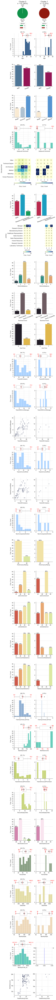

In [106]:
figClusterInt_cluster_M = fPlots.f_cluster_interpretation(n_clusters, df_M, 'cluster_M')
plt.show(figClusterInt_cluster_M)

<a class="anchor" id="clustering_attrition_drivers_M-ki"></a>
<b>Key Insights</b>:
   >- Despite the employees in attrition for this Job Role are not representative (only 5 out of 102), they do more overtime and all that have the highest performance rating are not leaving the company.

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition_drivers_RD"></a>
##### 3.3.2.2.9 Research Director

In [107]:
df_RD = df_treated[df_treated['JobRole'] == 'Research Director'].copy()

Variable selection: `Attrition_flag`

In [108]:
vars_clustering = ['Attrition_flag']

In [109]:
df_KMeans_RD = df_RD[vars_clustering].copy()

In [110]:
n_clusters = 2

# Create a KMeans instance with k clusters: model
model = KMeans(n_clusters = n_clusters, n_init = 50, precompute_distances = True, max_iter = 500)

# Fit model to samples
model.fit(df_KMeans_RD)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=500,
       n_clusters=2, n_init=50, n_jobs=None, precompute_distances=True,
       random_state=None, tol=0.0001, verbose=0)

In [111]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_RD = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_RD.fit(df_KMeans_RD)

del df_KMeans_RD # drop auxiliary dataframe to perfom the clustering

In [112]:
centroids = pd.DataFrame(model_KMeans_RD.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1
Attrition_flag,0.0000,1.0000


In [113]:
# assign the cluster labels to the dataframe
df_RD['cluster_RD'] = model_KMeans_RD.labels_

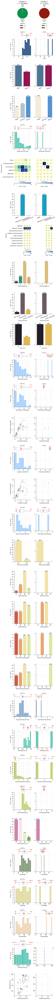

In [114]:
figClusterInt_cluster_RD = fPlots.f_cluster_interpretation(n_clusters, df_RD, 'cluster_RD')
plt.show(figClusterInt_cluster_RD)

<a class="anchor" id="clustering_attrition_drivers_RD-ki"></a>
<b>Key Insights</b>:
   >- Despite the employees in attrition for this Job Role are not representative (only 2 out of 80), all that have the highest performance rating are not leaving the company.

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition_recomendations"></a>
##### 3.3.2.3: And what could the company do to prevent it?

Considering the different drivers previously identified, we listed below some possible recommendations to prevent employee attrition (please consider that some assumptions were made and those needed to be further accessed with the company before implementation):

   >- <b>DistanceFromHome</b>: The company could either allow some remote work from home, whenever applicable, or provide an allowance to compensate the transport distances to commute from home to work.
   >
   >- <b>WorkLifeBalance</b>: Assuming there are no flexible work hours, whenever applicable, the company could improve the flexibility of the working time schedule. Another option would be to allow some remote work from home, whenever applicable.
   >
   >- <b>BusinessTravel</b>: The company could give a compensation to all the employees that travel significantly more, such as more holidays or even an economical compensation depending on how long they are out.
   >
   >- <b>OverTime</b>: Assuming the overtime is not currently being remunerated (there is no evidence of that as the employees that do more overtime don't seem to have higher incomes) and since the overtime doesn’t seem to be related to employee performance, it appears to be required. So, the company could hire more people, improve the way the projects are planned or start/increase its remuneration.  
   >
   >- <b>YearsWithCurrManager</b>: Maybe in this case an analysis on the hard but mainly on the soft skills of the managers for the departments where this variable is a driver for employee attrition is required.    
   >
   >- <b>MonthlyIncome</b>: The company could reduce the income gap for the same JobRole and JobLevel in a progressive way ans taking into special consideration the performance rating of the employees.  
   >
   >- <b>StockOptionLevel</b>: The company could level-out the stock option levels for the same JobRole and JobLevel, using this as bonus (whenever applicable).  

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_attrition_performance"></a>
##### 3.3.2.4: Is the company losing the top performers (internal perspective)?

In [115]:
vars_clustering = ['Attrition_flag','PerfRating_3_flag']

In [116]:
df_KMeans_Performance = df_treated[vars_clustering].copy()

In [117]:
ks = range(1, 15)
inertias = []
k = []

for n in ks:
    k.append(n)
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters = n, n_init = 50, precompute_distances = True, max_iter = 500)

    # Fit model to samples
    model.fit(df_KMeans_Performance)

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
    if(model.inertia_<0.01):
        break

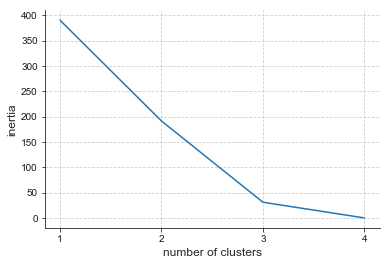

In [118]:
# Plot ks (x-axis) vs inertias (y-axis)
plt.plot(k, inertias)
plt.xlabel('number of clusters', fontsize = 12)
plt.ylabel('inertia', fontsize = 12)
plt.xticks(np.arange(min(k), max(k) + 1, 1))
plt.show()

Looking at this plot `4` seems to be a good number of clusters as from this point onwards the inertia begin to decrease more slowly. So, let's try it.

In [119]:
n_clusters = 4

In [120]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_Performance = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_Performance.fit(df_KMeans_Performance)

del df_KMeans_Performance # drop auxiliary dataframe to perfom the clustering

In [121]:
# assign the cluster labels to the dataframe
df_treated['cluster_Performance'] = model_KMeans_Performance.labels_

In [122]:
centroids = pd.DataFrame(model_KMeans_Performance.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1,2,3
Attrition_flag,-0.0000,-0.0000,1.0000,1.0000
PerfRating_3_flag,-0.0000,1.0000,1.0000,-0.0000


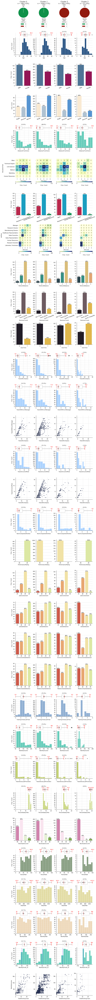

In [123]:
figClusterInt_cluster_Performance = fPlots.f_cluster_interpretation(n_clusters, df_treated,\
                                                                         'cluster_Performance')
plt.show(figClusterInt_cluster_Performance)

<a class="anchor" id="clustering_attrition_performance-ki"></a>
<b>Key Insights</b>:


   >- From analysing the four clusters, we can find top performers who want to stay in the company and others in attrition. Therefore, there are no evidences that `PerformanceRating` represents a leading factor for employee attrition.
   >- Focusing on the cluster with top performers that are in attrition, despite doing more OverTime, their MonthlyIncome is lower than the ones staying in the company. This situation coupled with the number of companies they worked (with a median of 1), could suggest that employees who start their working life in the current company are below the average salaries.
   >- But who are these top performers in attrition? Essentially, they represent employees in the lowest levels of the more technical job roles (focus on Research Scientists and Laboratory Technicians).

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_features"></a>
#### 3.3.3: Clustering Analysis (Feature Creation)

<a class="anchor" id="clustering_features_JobRole"></a>
##### 3.3.3.1: Clustering JobRole

<a class="anchor" id="clustering_features_JobLevel_SR"></a>
###### 3.3.3.1.1: Sales Representative

Variable selection: `JR_SalesRep_flag`, `BT_Non-Travel_flag`, `MonthlyIncome_z`, `YearsWithCurrManager_z`, `OverTime_flag`]

In [124]:
vars_clustering = ['JR_SalesRep_flag', 'BT_Non-Travel_flag', \
                   'MonthlyIncome_z','YearsWithCurrManager_z',\
                   'OverTime_flag']

In [125]:
df_KMeans_JobRoleSR = df_SR[vars_clustering].copy()

In [126]:
ks = range(1, 15)
inertias = []
k = []

for n in ks:
    k.append(n)
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters = n, n_init = 50, precompute_distances = True, max_iter = 500)

    # Fit model to samples
    model.fit(df_KMeans_JobRoleSR)

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
    if(model.inertia_<1):
        break

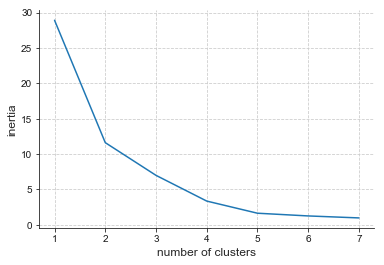

In [127]:
# Plot ks (x-axis) vs inertias (y-axis)
plt.plot(k, inertias)
plt.xlabel('number of clusters', fontsize = 12)
plt.ylabel('inertia', fontsize = 12)
plt.xticks(np.arange(min(k), max(k) + 1, 1))
plt.show()

Looking at this plot `2` seems to be a good number of clusters as from this point onwards the inertia begin to decrease more slowly. So, let's try it.

In [128]:
n_clusters = 2

In [129]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_JobRoleSR = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_JobRoleSR.fit(df_KMeans_JobRoleSR)

del df_KMeans_JobRoleSR # drop auxiliary dataframe to perfom the clustering

In [130]:
# assign the cluster labels to the dataframe
df_SR['cluster_JobRoleSR'] = model_KMeans_JobRoleSR.labels_

In [131]:
centroids = pd.DataFrame(model_KMeans_JobRoleSR.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1
JR_SalesRep_flag,1.0000,1.0000
BT_Non-Travel_flag,0.0847,-0.0000
MonthlyIncome_z,0.3707,0.3521
YearsWithCurrManager_z,0.2853,0.3678
OverTime_flag,0.0000,1.0000


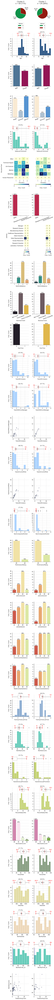

In [132]:
figClusterInt_cluster_JobRoleSR = fPlots.f_cluster_interpretation(n_clusters, df_SR, 'cluster_JobRoleSR')
plt.show(figClusterInt_cluster_JobRoleSR)

In [133]:
# add the cluster index to the unfiltered dataframe
cluster_idx = []
for index, row in df_treated.iterrows():
    if(row['JobRole'] == 'Sales Representative'):
        cluster_idx.append(df_SR[df_SR['EmployeeNumber'] == row['EmployeeNumber']]['cluster_JobRoleSR'].iloc[0])
    else:
        cluster_idx.append(centroids.shape[0])
df_treated['cluster_JR_SalesRep'] = cluster_idx

In [134]:
# determine the centroid of the new cluster (covering all the unfiltered records ... from other Job Roles)
new_cluster = {}
for var in centroids.columns:
    exec('new_cluster[' + '\'' + var + '\'' + '] = ' + \
         '{:.4f}'.format(eval('np.mean(df_treated[~df_treated.isin(df_SR.to_dict(' + '\'' + 'l' + '\'' + \
                              ')).all(1)][' + '\'' + var + '\'' + '])')))
centroids = centroids.append(new_cluster, ignore_index = True)
centroids.T

,0,1,2
JR_SalesRep_flag,1.0000,1.0000,0.0565
BT_Non-Travel_flag,0.0847,-0.0000,0.1020
MonthlyIncome_z,0.3707,0.3521,0.6064
YearsWithCurrManager_z,0.2853,0.3678,0.5150
OverTime_flag,0.0000,1.0000,0.2830


In [135]:
# assign the labels to each cluster
cluster_names = {}
for idx, row in centroids.iterrows():
    if(row['OverTime_flag'] > .9):
        cluster_names[idx] = 'JR_SalesRep_Attrition_OverTime'    
    elif((row['BT_Non-Travel_flag'] < .1) & (row['OverTime_flag'] < .1)):
        cluster_names[idx] = 'JR_SalesRep_Attrition'
    else:
        cluster_names[idx] = 'JR_SalesRep_Other'
cluster_names

{0: 'JR_SalesRep_Attrition',
 1: 'JR_SalesRep_Attrition_OverTime',
 2: 'JR_SalesRep_Other'}

In [136]:
# calculate the cluster center distances for each record
for idx, row in centroids.iterrows():
    exec('dist_cluster_' + str(idx) + ' = []')
    
for df_idx, df_row in df_treated.iterrows():    
    #cluster_int = int(df_row['cluster_JR_SalesRep'])
    for idx, row in centroids.iterrows():
        dist_aux = 0
        var_idx = 0
        for var in centroids.columns:
            dist_aux = dist_aux + ((eval('df_row[' + '\'' + var + '\'' + ']') - \
                                    centroids.iloc[idx, var_idx]))**2
            var_idx = var_idx + 1
            
        eval('dist_cluster_' + str(idx)).append(dist_aux**.5)
            
for idx, row in centroids.iterrows():
    exec('df_treated.loc[:, ' + '\'' + 'distcluster_' + cluster_names.get(idx) + '_z' + '\'' + '] = ' + \
         'dist_cluster_' + str(idx))
              
df_treated['cluster_JR_SalesRep'] = [cluster_names.get(value) for value in df_treated['cluster_JR_SalesRep']]

In [137]:
df_treated.drop(columns = ['distcluster_JR_SalesRep_Other_z'], inplace = True)

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_features_JobLevel_LT"></a>
###### 3.3.3.1.2: Laboratory Technician

Variable selection: `JR_LabTech_flag`, `WLBalance_1_flag`, `StockOpt_0_flag`, `YearsAtCompany_z`]

In [138]:
vars_clustering = ['JR_LabTech_flag', 'WLBalance_1_flag',\
                   'StockOpt_0_flag','YearsAtCompany_z']

In [139]:
df_KMeans_JobRoleLT = df_LT[vars_clustering].copy()

In [140]:
ks = range(1, 15)
inertias = []
k = []

for n in ks:
    k.append(n)
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters = n, n_init = 50, precompute_distances = True, max_iter = 500)

    # Fit model to samples
    model.fit(df_KMeans_JobRoleLT)

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
    if(model.inertia_<1):
        break

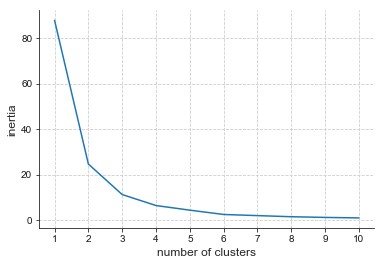

In [141]:
# Plot ks (x-axis) vs inertias (y-axis)
plt.plot(k, inertias)
plt.xlabel('number of clusters', fontsize = 12)
plt.ylabel('inertia', fontsize = 12)
plt.xticks(np.arange(min(k), max(k) + 1, 1))
plt.show()

Looking at this plot `3` seems to be a good number of clusters as from this point onwards the inertia begin to decrease more slowly. So, let's try it.

In [142]:
n_clusters = 3

In [143]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_JobRoleLT = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_JobRoleLT.fit(df_KMeans_JobRoleLT)

del df_KMeans_JobRoleLT # drop auxiliary dataframe to perfom the clustering

In [144]:
# assign the cluster labels to the dataframe
df_LT['cluster_JobRoleLT'] = model_KMeans_JobRoleLT.labels_

In [145]:
centroids = pd.DataFrame(model_KMeans_JobRoleLT.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1,2
JR_LabTech_flag,1.0000,1.0000,1.0000
WLBalance_1_flag,0.0000,-0.0000,1.0000
StockOpt_0_flag,1.0000,0.0000,0.6000
YearsAtCompany_z,0.3915,0.4239,0.3771


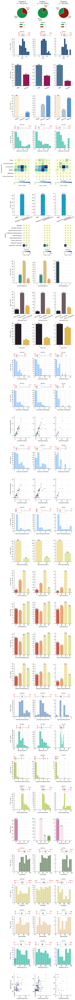

In [146]:
figClusterInt_cluster_JobRoleLT = fPlots.f_cluster_interpretation(n_clusters, df_LT, 'cluster_JobRoleLT')
plt.show(figClusterInt_cluster_JobRoleLT)

In [147]:
# add the cluster index to the unfiltered dataframe
cluster_idx = []
for index, row in df_treated.iterrows():
    if(row['JobRole'] == 'Laboratory Technician'):
        cluster_idx.append(df_LT[df_LT['EmployeeNumber'] == row['EmployeeNumber']]['cluster_JobRoleLT'].iloc[0])
    else:
        cluster_idx.append(centroids.shape[0])
df_treated['cluster_JR_LabTech'] = cluster_idx

In [148]:
# determine the centroid of the new cluster (covering all the unfiltered records ... from other Job Roles)
new_cluster = {}
for var in centroids.columns:
    exec('new_cluster[' + '\'' + var + '\'' + '] = ' + \
         '{:.4f}'.format(eval('np.mean(df_treated[~df_treated.isin(df_LT.to_dict(' + '\'' + 'l' + '\'' + \
                              ')).all(1)][' + '\'' + var + '\'' + '])')))
centroids = centroids.append(new_cluster, ignore_index = True)
centroids.T

,0,1,2,3
JR_LabTech_flag,1.0000,1.0000,1.0000,0.1762
WLBalance_1_flag,0.0000,-0.0000,1.0000,0.0544
StockOpt_0_flag,1.0000,0.0000,0.6000,0.4293
YearsAtCompany_z,0.3915,0.4239,0.3771,0.4663


In [149]:
# assign the labels to each cluster
cluster_names = {}
for idx, row in centroids.iterrows():
    if(row['WLBalance_1_flag'] > .9):
        cluster_names[idx] = 'JR_LabTech_Attrition_WorkLifeBalance1'
    elif((row['StockOpt_0_flag'] < .1) & (row['WLBalance_1_flag'] < .1)):
        cluster_names[idx] = 'JR_LabTech'    
    elif(row['StockOpt_0_flag'] > .9):
        cluster_names[idx] = 'JR_LabTech_Attrition_NoStockOption'
    else:
        cluster_names[idx] = 'JR_LabTech_Other'
cluster_names

{0: 'JR_LabTech_Attrition_NoStockOption',
 1: 'JR_LabTech',
 2: 'JR_LabTech_Attrition_WorkLifeBalance1',
 3: 'JR_LabTech_Other'}

In [150]:
# calculate the cluster center distances for each record
for idx, row in centroids.iterrows():
    exec('dist_cluster_' + str(idx) + ' = []')
    
for df_idx, df_row in df_treated.iterrows():    
    #cluster_int = int(row['cluster_JR_LabTech'])
    for idx, row in centroids.iterrows():
        dist_aux = 0
        var_idx = 0
        for var in centroids.columns:
            dist_aux = dist_aux + ((eval('df_row[' + '\'' + var + '\'' + ']') - \
                                    centroids.iloc[idx, var_idx]))**2
            var_idx = var_idx + 1
            
        eval('dist_cluster_' + str(idx)).append(dist_aux**.5)
            
for idx, row in centroids.iterrows():
    exec('df_treated.loc[:, ' + '\'' + 'distcluster_' + cluster_names.get(idx) + '_z' + '\'' + '] = ' + \
         'dist_cluster_' + str(idx))
              
df_treated['cluster_JR_LabTech'] = [cluster_names.get(value) for value in df_treated['cluster_JR_LabTech']]

In [151]:
df_treated.drop(columns = ['distcluster_JR_LabTech_Other_z'], inplace = True)

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_features_JobLevel_HR"></a>
###### 3.3.3.1.3: Human Resources

Variable selection: `JR_HR_flag`, `DistanceFromHome_z`, `MonthlyIncome_z`, `Age_z`, `YearsWithCurrManager_z`]

In [152]:
vars_clustering = ['JR_HR_flag',\
                   'DistanceFromHome_z', 'MonthlyIncome_z', 'Age_z', 'YearsWithCurrManager_z']

In [153]:
df_KMeans_JobRoleHR = df_HR[vars_clustering].copy()

In [154]:
ks = range(1, 15)
inertias = []
k = []

for n in ks:
    k.append(n)
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters = n, n_init = 50, precompute_distances = True, max_iter = 500)

    # Fit model to samples
    model.fit(df_KMeans_JobRoleHR)

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
    if(model.inertia_<1):
        break

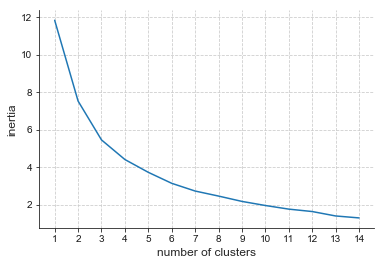

In [155]:
# Plot ks (x-axis) vs inertias (y-axis)
plt.plot(k, inertias)
plt.xlabel('number of clusters', fontsize = 12)
plt.ylabel('inertia', fontsize = 12)
plt.xticks(np.arange(min(k), max(k) + 1, 1))
plt.show()

Looking at this plot `3` seems to be a good number of clusters as from this point onwards the inertia begin to decrease more slowly. So, let's try it.

In [156]:
n_clusters = 3

In [157]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_JobRoleHR = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_JobRoleHR.fit(df_KMeans_JobRoleHR)

del df_KMeans_JobRoleHR # drop auxiliary dataframe to perfom the clustering

In [158]:
# assign the cluster labels to the dataframe
df_HR['cluster_JobRoleHR'] = model_KMeans_JobRoleHR.labels_

In [159]:
centroids = pd.DataFrame(model_KMeans_JobRoleHR.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1,2
JR_HR_flag,1.0000,1.0000,1.0000
DistanceFromHome_z,0.6775,0.1576,0.7001
MonthlyIncome_z,0.3600,0.5287,0.5191
Age_z,0.2731,0.6039,0.4935
YearsWithCurrManager_z,0.0474,0.5090,0.6012


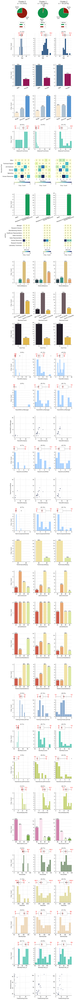

In [160]:
figClusterInt_cluster_JobRoleHR = fPlots.f_cluster_interpretation(n_clusters, df_HR, 'cluster_JobRoleHR')
plt.show(figClusterInt_cluster_JobRoleHR)

In [161]:
# add the cluster index to the unfiltered dataframe
cluster_idx = []
for index, row in df_treated.iterrows():
    if(row['JobRole'] == 'Human Resources'):
        cluster_idx.append(df_HR[df_HR['EmployeeNumber'] == row['EmployeeNumber']]['cluster_JobRoleHR'].iloc[0])
    else:
        cluster_idx.append(centroids.shape[0])
df_treated['cluster_JR_HR'] = cluster_idx

In [162]:
# determine the centroid of the new cluster (covering all the unfiltered records ... from other Job Roles)
new_cluster = {}
for var in centroids.columns:
    exec('new_cluster[' + '\'' + var + '\'' + '] = ' + \
         '{:.4f}'.format(eval('np.mean(df_treated[~df_treated.isin(df_HR.to_dict(' + '\'' + 'l' + '\'' + \
                              ')).all(1)][' + '\'' + var + '\'' + '])')))
centroids = centroids.append(new_cluster, ignore_index = True)
centroids.T

,0,1,2,3
JR_HR_flag,1.0000,1.0000,1.0000,0.0354
DistanceFromHome_z,0.6775,0.1576,0.7001,0.4813
MonthlyIncome_z,0.3600,0.5287,0.5191,0.6064
Age_z,0.2731,0.6039,0.4935,0.5418
YearsWithCurrManager_z,0.0474,0.5090,0.6012,0.5150


In [163]:
# assign the labels to each cluster
cluster_names = {}
for idx, row in centroids.iterrows():
    if(row['DistanceFromHome_z'] < .25):
        cluster_names[idx] = 'JR_HR_LowAttrition'
    elif((row['DistanceFromHome_z'] > .6) & (row['MonthlyIncome_z'] > .45)):
        cluster_names[idx] = 'JR_HR_MediumAttrition'    
    elif((row['DistanceFromHome_z'] > .6) & (row['MonthlyIncome_z'] < .45)):
        cluster_names[idx] = 'JR_HR_HighAttrition'
    else:
        cluster_names[idx] = 'JR_HR_Other'
cluster_names

{0: 'JR_HR_HighAttrition',
 1: 'JR_HR_LowAttrition',
 2: 'JR_HR_MediumAttrition',
 3: 'JR_HR_Other'}

In [164]:
# calculate the cluster center distances for each record
for idx, row in centroids.iterrows():
    exec('dist_cluster_' + str(idx) + ' = []')
    
for df_idx, df_row in df_treated.iterrows():    
    #cluster_int = int(row['cluster_JR_HR'])
    for idx, row in centroids.iterrows():
        dist_aux = 0
        var_idx = 0
        for var in centroids.columns:
            dist_aux = dist_aux + ((eval('df_row[' + '\'' + var + '\'' + ']') - \
                                    centroids.iloc[idx, var_idx]))**2
            var_idx = var_idx + 1
            
        eval('dist_cluster_' + str(idx)).append(dist_aux**.5)
            
for idx, row in centroids.iterrows():
    exec('df_treated.loc[:, ' + '\'' + 'distcluster_' + cluster_names.get(idx) + '_z' + '\'' + '] = ' + \
         'dist_cluster_' + str(idx))
              
df_treated['cluster_JR_HR'] = [cluster_names.get(value) for value in df_treated['cluster_JR_HR']]

In [165]:
df_treated.drop(columns = ['distcluster_JR_HR_Other_z'], inplace = True)

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_features_JobLevel_SE"></a>
###### 3.3.3.1.4: Sales Executive

Variable selection: `JR_SalesExec_flag`, `StockOpt_1_flag`, `OverTime_flag`, `NumCompaniesWorked_z`, `DistanceFromHome_z`]

In [166]:
vars_clustering = ['JR_SalesExec_flag',
                   'StockOpt_1_flag',
                   'OverTime_flag', \
                    'NumCompaniesWorked_z', 'DistanceFromHome_z']

In [167]:
df_KMeans_JobRoleSE = df_SE[vars_clustering].copy()

In [168]:
ks = range(1, 15)
inertias = []
k = []

for n in ks:
    k.append(n)
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters = n, n_init = 50, precompute_distances = True, max_iter = 500)

    # Fit model to samples
    model.fit(df_KMeans_JobRoleSE)

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
    if(model.inertia_<1):
        break

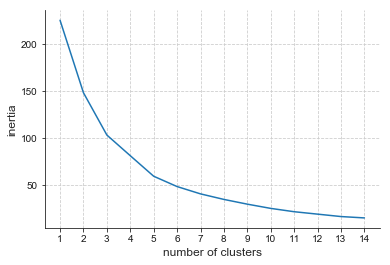

In [169]:
# Plot ks (x-axis) vs inertias (y-axis)
plt.plot(k, inertias)
plt.xlabel('number of clusters', fontsize = 12)
plt.ylabel('inertia', fontsize = 12)
plt.xticks(np.arange(min(k), max(k) + 1, 1))
plt.show()

Looking at this plot `3` seems to be a good number of clusters as from this point onwards the inertia begin to decrease more slowly. So, let's try it.

In [170]:
n_clusters = 3

In [171]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_JobRoleSE = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_JobRoleSE.fit(df_KMeans_JobRoleSE)

del df_KMeans_JobRoleSE # drop auxiliary dataframe to perfom the clustering

In [172]:
# assign the cluster labels to the dataframe
df_SE['cluster_JobRoleSE'] = model_KMeans_JobRoleSE.labels_

In [173]:
centroids = pd.DataFrame(model_KMeans_JobRoleSE.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1,2
JR_SalesExec_flag,1.0000,1.0000,1.0000
StockOpt_1_flag,0.3723,1.0000,-0.0000
OverTime_flag,1.0000,0.0000,0.0000
NumCompaniesWorked_z,0.3793,0.3733,0.4035
DistanceFromHome_z,0.5148,0.5192,0.4909


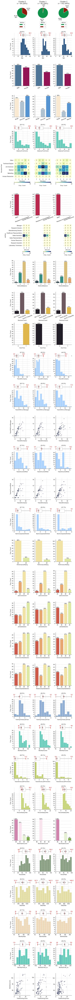

In [174]:
figClusterInt_cluster_JobRoleSE = fPlots.f_cluster_interpretation(n_clusters, df_SE, 'cluster_JobRoleSE')
plt.show(figClusterInt_cluster_JobRoleSE)

In [175]:
# add the cluster index to the unfiltered dataframe
cluster_idx = []
for index, row in df_treated.iterrows():
    if(row['JobRole'] == 'Sales Executive'):
        cluster_idx.append(df_SE[df_SE['EmployeeNumber'] == row['EmployeeNumber']]['cluster_JobRoleSE'].iloc[0])
    else:
        cluster_idx.append(centroids.shape[0])
df_treated['cluster_JR_SalesExec'] = cluster_idx

In [176]:
# determine the centroid of the new cluster (covering all the unfiltered records ... from other Job Roles)
new_cluster = {}
for var in centroids.columns:
    exec('new_cluster[' + '\'' + var + '\'' + '] = ' + \
         '{:.4f}'.format(eval('np.mean(df_treated[~df_treated.isin(df_SE.to_dict(' + '\'' + 'l' + '\'' + \
                              ')).all(1)][' + '\'' + var + '\'' + '])')))
centroids = centroids.append(new_cluster, ignore_index = True)
centroids.T

,0,1,2,3
JR_SalesExec_flag,1.0000,1.0000,1.0000,0.2218
StockOpt_1_flag,0.3723,1.0000,-0.0000,0.4054
OverTime_flag,1.0000,0.0000,0.0000,0.2830
NumCompaniesWorked_z,0.3793,0.3733,0.4035,0.3801
DistanceFromHome_z,0.5148,0.5192,0.4909,0.4813


In [177]:
# assign the labels to each cluster
cluster_names = {}
for idx, row in centroids.iterrows():
    if(row['OverTime_flag'] > .9):
        cluster_names[idx] = 'JR_SalesExec_Attrition_OverTime'
    elif(row['StockOpt_1_flag'] < .1):
        cluster_names[idx] = 'JR_SalesExec_NoStockOption1'    
    elif((row['StockOpt_1_flag'] > .9) & (row['OverTime_flag'] < .1)):
        cluster_names[idx] = 'JR_SalesExec_LowAttrition'
    else:
        cluster_names[idx] = 'JR_SalesExec_Other'
cluster_names

{0: 'JR_SalesExec_Attrition_OverTime',
 1: 'JR_SalesExec_LowAttrition',
 2: 'JR_SalesExec_NoStockOption1',
 3: 'JR_SalesExec_Other'}

In [178]:
# calculate the cluster center distances for each record
for idx, row in centroids.iterrows():
    exec('dist_cluster_' + str(idx) + ' = []')
    
for df_idx, df_row in df_treated.iterrows():    
    #cluster_int = int(row['cluster_JR_SalesExec'])
    for idx, row in centroids.iterrows():
        dist_aux = 0
        var_idx = 0
        for var in centroids.columns:
            dist_aux = dist_aux + ((eval('df_row[' + '\'' + var + '\'' + ']') - \
                                    centroids.iloc[idx, var_idx]))**2
            var_idx = var_idx + 1
            
        eval('dist_cluster_' + str(idx)).append(dist_aux**.5)
            
for idx, row in centroids.iterrows():
    exec('df_treated.loc[:, ' + '\'' + 'distcluster_' + cluster_names.get(idx) + '_z' + '\'' + '] = ' + \
         'dist_cluster_' + str(idx))
              
df_treated['cluster_JR_SalesExec'] = [cluster_names.get(value) for value in df_treated['cluster_JR_SalesExec']]

In [179]:
df_treated.drop(columns = ['distcluster_JR_SalesExec_Other_z'], inplace = True)

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="clustering_features_JobLevel_RS"></a>
###### 3.3.3.1.5: Research Scientist

Variable selection: `JR_ResrchScist_flag`, `StockOpt_2_flag`, `RelSatisf_4_flag`, `MonthlyIncome_z`, `TotalWorkingYears_z`

In [180]:
vars_clustering = ['JR_ResrchScist_flag', 'StockOpt_2_flag','RelSatisf_4_flag',
                   'MonthlyIncome_z',
                   'TotalWorkingYears_z']

In [181]:
df_KMeans_JobRoleRS = df_RS[vars_clustering].copy()

In [182]:
ks = range(1, 15)
inertias = []
k = []

for n in ks:
    k.append(n)
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters = n, n_init = 50, precompute_distances = True, max_iter = 500)

    # Fit model to samples
    model.fit(df_KMeans_JobRoleRS)

    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
    if(model.inertia_<1):
        break

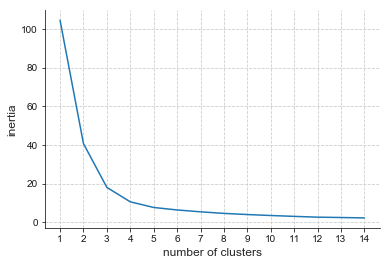

In [183]:
# Plot ks (x-axis) vs inertias (y-axis)
plt.plot(k, inertias)
plt.xlabel('number of clusters', fontsize = 12)
plt.ylabel('inertia', fontsize = 12)
plt.xticks(np.arange(min(k), max(k) + 1, 1))
plt.show()

Looking at this plot `3` seems to be a good number of clusters as from this point onwards the inertia begin to decrease more slowly. So, let's try it.

In [184]:
n_clusters = 3

In [185]:
cluster_color_palette = sns.color_palette('Accent', n_clusters)
model_KMeans_JobRoleRS = KMeans(n_clusters = n_clusters, n_init = 50, max_iter = 1000)
model_KMeans_JobRoleRS.fit(df_KMeans_JobRoleRS)

del df_KMeans_JobRoleRS # drop auxiliary dataframe to perfom the clustering

In [186]:
# assign the cluster labels to the dataframe
df_RS['cluster_JobRoleRS'] = model_KMeans_JobRoleRS.labels_

In [187]:
centroids = pd.DataFrame(model_KMeans_JobRoleRS.cluster_centers_, columns = vars_clustering)
centroids.T

,0,1,2
JR_ResrchScist_flag,1.0000,1.0000,1.0000
StockOpt_2_flag,-0.0000,-0.0000,1.0000
RelSatisf_4_flag,0.0000,1.0000,0.3235
MonthlyIncome_z,0.4450,0.4114,0.4561
TotalWorkingYears_z,0.4722,0.4331,0.4981


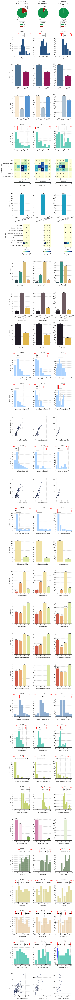

In [188]:
figClusterInt_cluster_JobRoleRS = fPlots.f_cluster_interpretation(n_clusters, df_RS, 'cluster_JobRoleRS')
plt.show(figClusterInt_cluster_JobRoleRS)

In [189]:
# add the cluster index to the unfiltered dataframe
cluster_idx = []
for index, row in df_treated.iterrows():
    if(row['JobRole'] == 'Research Scientist'):
        cluster_idx.append(df_RS[df_RS['EmployeeNumber'] == row['EmployeeNumber']]['cluster_JobRoleRS'].iloc[0])
    else:
        cluster_idx.append(centroids.shape[0])
df_treated['cluster_JR_ResrchScist'] = cluster_idx

In [190]:
# determine the centroid of the new cluster (covering all the unfiltered records ... from other Job Roles)
new_cluster = {}
for var in centroids.columns:
    exec('new_cluster[' + '\'' + var + '\'' + '] = ' + \
         '{:.4f}'.format(eval('np.mean(df_treated[~df_treated.isin(df_RS.to_dict(' + '\'' + 'l' + '\'' + \
                              ')).all(1)][' + '\'' + var + '\'' + '])')))
centroids = centroids.append(new_cluster, ignore_index = True)
centroids.T

,0,1,2,3
JR_ResrchScist_flag,1.0000,1.0000,1.0000,0.1986
StockOpt_2_flag,-0.0000,-0.0000,1.0000,0.1075
RelSatisf_4_flag,0.0000,1.0000,0.3235,0.2939
MonthlyIncome_z,0.4450,0.4114,0.4561,0.6064
TotalWorkingYears_z,0.4722,0.4331,0.4981,0.5447


In [191]:
# assign the labels to each cluster
cluster_names = {}
for idx, row in centroids.iterrows():
    if(row['StockOpt_2_flag'] > .9):
        cluster_names[idx] = 'JR_ResrchScist_NoAttrition'
    elif((row['RelSatisf_4_flag'] > .9) & (row['JR_ResrchScist_flag'] > .9)):
        cluster_names[idx] = 'JR_ResrchScist_LowAttrition'  
    elif((row['RelSatisf_4_flag'] < .1) & (row['JR_ResrchScist_flag'] > .9)):
        cluster_names[idx] = 'JR_ResrchScist_HighAttrition'
    else:
        cluster_names[idx] = 'JR_ResrchScist_Other'
cluster_names

{0: 'JR_ResrchScist_HighAttrition',
 1: 'JR_ResrchScist_LowAttrition',
 2: 'JR_ResrchScist_NoAttrition',
 3: 'JR_ResrchScist_Other'}

In [192]:
# calculate the cluster center distances for each record
for idx, row in centroids.iterrows():
    exec('dist_cluster_' + str(idx) + ' = []')
    
for df_idx, df_row in df_treated.iterrows():    
    #cluster_int = int(row['cluster_JR_ResrchScist'])
    for idx, row in centroids.iterrows():
        dist_aux = 0
        var_idx = 0
        for var in centroids.columns:
            dist_aux = dist_aux + ((eval('df_row[' + '\'' + var + '\'' + ']') - \
                                    centroids.iloc[idx, var_idx]))**2
            var_idx = var_idx + 1
            
        eval('dist_cluster_' + str(idx)).append(dist_aux**.5)
            
for idx, row in centroids.iterrows():
    exec('df_treated.loc[:, ' + '\'' + 'distcluster_' + cluster_names.get(idx) + '_z' + '\'' + '] = ' + \
         'dist_cluster_' + str(idx))
              
df_treated['cluster_JR_ResrchScist'] = [cluster_names.get(value) for value in df_treated['cluster_JR_ResrchScist']]

In [193]:
df_treated.drop(columns = ['distcluster_JR_ResrchScist_Other_z'], inplace = True)

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="select-clustering_selected"></a>
##### 3.3.3.2: Selected Dataset

Create the selected dataframe from all the results of the clustering analysis.

In [194]:
df_selected = df_treated.copy()
df_selected.drop(['Dep_Sales_flag', 'Dep_HR_flag',\
                  'JR_LabTech_flag', 'JR_ResrchScist_flag', 'JR_HR_flag', 'JR_SalesRep_flag', 'JR_SalesExec_flag',\
                  #'RelSatisf_1_flag', 'RelSatisf_2_flag', 'RelSatisf_4_flag', 'JobSatisf_1_flag', 'JobSatisf_2_flag',\
                  #'JobSatisf_4_flag', 'EnvSatisf_1_flag', 'EnvSatisf_2_flag', 'EnvSatisf_4_flag', 'Educ_HR_flag',\
                  #'Educ_Marketing_flag','Educ_Medical_flag', 'Educ_LifeSciences_flag','Educ_TechDegree_flag'\
                 ], axis = 1, inplace = True)

In [195]:
df_selected[df_selected.columns[pd.Series(df_selected.columns).str.contains('flag')]].describe().T

,count,mean,std,min,25%,50%,75%,max
Attrition_flag,1470.0000,0.1612,0.3679,0.0000,0.0000,0.0000,0.0000,1.0000
OverTime_flag,1470.0000,0.2830,0.4506,0.0000,0.0000,0.0000,1.0000,1.0000
BT_Non-Travel_flag,1470.0000,0.1020,0.3028,0.0000,0.0000,0.0000,0.0000,1.0000
BT_Travel_Frequently_flag,1470.0000,0.1884,0.3912,0.0000,0.0000,0.0000,0.0000,1.0000
Educ_HR_flag,1470.0000,0.0184,0.1343,0.0000,0.0000,0.0000,0.0000,1.0000
Educ_Marketing_flag,1470.0000,0.1082,0.3107,0.0000,0.0000,0.0000,0.0000,1.0000
Educ_Medical_flag,1470.0000,0.3156,0.4649,0.0000,0.0000,0.0000,1.0000,1.0000
Educ_LifeSciences_flag,1470.0000,0.4122,0.4924,0.0000,0.0000,0.0000,1.0000,1.0000
Educ_TechDegree_flag,1470.0000,0.0898,0.2860,0.0000,0.0000,0.0000,0.0000,1.0000
Gender_Female_flag,1470.0000,0.4000,0.4901,0.0000,0.0000,0.0000,1.0000,1.0000


In [196]:
# Assign the columns to apply the normalization (not covered before with transformations)
df_selected_z = df_selected[df_selected.columns[pd.Series(df_selected.columns).str.contains('distcluster_')]]

In [197]:
# Apply the Min-Max Normalization
df_selected_z = df_selected_z.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)))

In [198]:
df_selected[df_selected.columns[pd.Series(df_selected.columns).str.contains('distcluster_')]] = df_selected_z

In [199]:
df_selected[df_selected.columns[pd.Series(df_selected.columns).str.contains('_z')]].describe().T

,count,mean,std,min,25%,50%,75%,max
MonthlyIncome_z,1470.0000,0.6064,0.2110,0.0000,0.4246,0.6038,0.7675,1.0000
Age_z,1470.0000,0.5418,0.2109,0.0000,0.3892,0.5401,0.6937,1.0000
DistanceFromHome_z,1470.0000,0.4813,0.3116,0.0000,0.1685,0.5187,0.7412,1.0000
NumCompaniesWorked_z,1470.0000,0.3801,0.3936,0.0000,0.0000,0.4519,0.7606,1.0000
PercentSalaryHike_z,1470.0000,0.4420,0.2963,0.0000,0.1612,0.4067,0.7174,1.0000
TotalWorkingYears_z,1470.0000,0.5447,0.1761,0.0000,0.4426,0.5514,0.6564,1.0000
TrainingTimesLastYear_z,1470.0000,0.5837,0.1968,0.0000,0.4808,0.6300,0.6300,1.0000
YearsAtCompany_z,1470.0000,0.4663,0.1740,0.0000,0.3708,0.4515,0.5657,1.0000
YearsInCurrentRole_z,1470.0000,0.5056,0.2636,0.0000,0.4584,0.5300,0.7163,1.0000
YearsSinceLastPromotion_z,1470.0000,0.4664,0.3860,0.0000,0.0000,0.6677,0.7925,1.0000


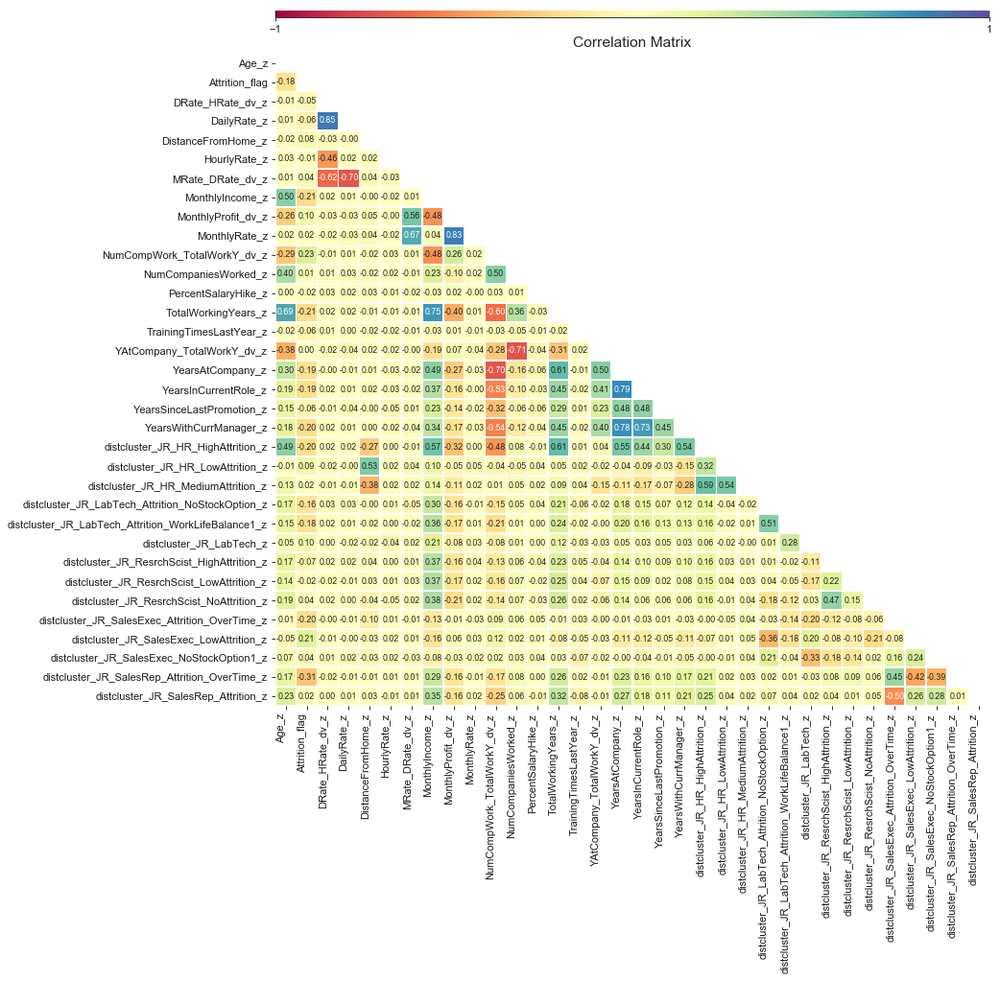

In [200]:
figure_CorrelMatrix = fPlots.f_CorrMatrix(df_selected[df_selected.columns[pd.Series(df_selected.columns).str.contains('_z')] | \
                                                 df_selected.columns[pd.Series(df_selected.columns).str.contains('Attrition_flag')]].corr(),12, 12, 8)
plt.show(figure_CorrelMatrix)

In [201]:
# drop highly correlated variables
df_selected.drop(columns = ['DRate_HRate_dv_z', 'MonthlyRate_z'], inplace = True)

In [202]:
df_selected_norm = pd.concat([df_selected[df_selected.columns[pd.Series(df_selected.columns).str.contains('_z')]],\
                              df_selected[df_selected.columns[pd.Series(df_selected.columns).str.contains('flag')]]],\
                             axis = 1)
df_selected_norm.to_csv('df_selected_norm.csv', sep = '\t', index = False)

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="feature-importance_raw"></a>
#### 3.3.4: Feature Importance (Decision Tree Classifier): Raw Dataset

In [203]:
from sklearn.tree import DecisionTreeClassifier

In [204]:
target = df_treated_norm['Attrition_flag']
data = df_treated_norm.loc[:, df_treated_norm.columns != 'Attrition_flag']

In [205]:
# Use a Decision Tree Classifier for Feature Selection
modelDT_raw = DecisionTreeClassifier()
modelDT_raw.fit(X = data, y = target)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

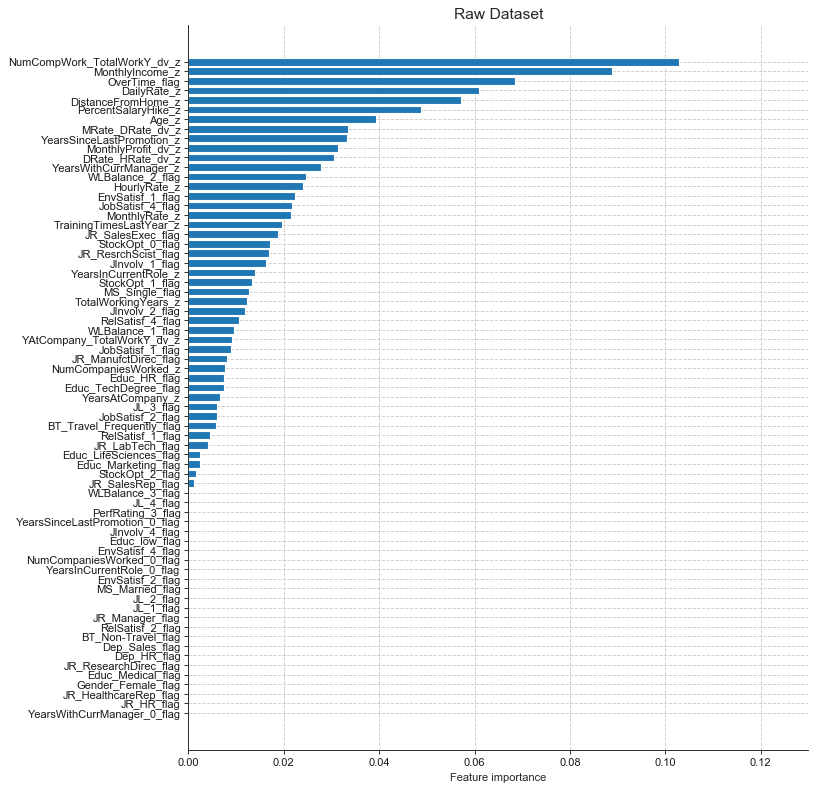

In [206]:
figure_FeatureImp_ = fPlots.f_feature_importances(modelDT_raw, data, 'Raw Dataset', 10, 12, .13)
plt.show(figure_FeatureImp_)

[Return to Table of Contents](#Table_Contents)

<a class="anchor" id="feature-importance_selected"></a>
#### 3.3.5 : Feature Importance (Decision Tree Classifier): Selected Dataset

In [207]:
target = df_selected_norm['Attrition_flag']
data = df_selected_norm.loc[:, df_selected_norm.columns != 'Attrition_flag']

In [208]:
# Use a Decision Tree Classifier for Feature Selection
modelDT_selected = DecisionTreeClassifier()
modelDT_selected.fit(X = data, y = target)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

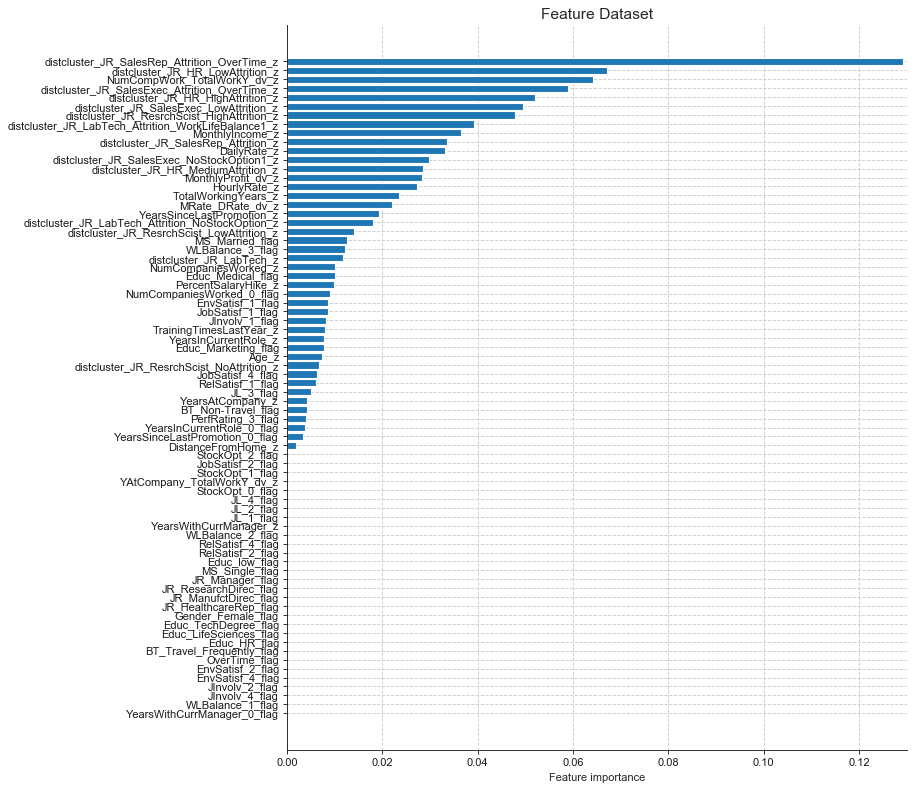

In [209]:
figure_FeatureImp_selected = fPlots.f_feature_importances(modelDT_selected, data, 'Feature Dataset', 10, 12, .13)
plt.show(figure_FeatureImp_selected)

[Return to Table of Contents](#Table_Contents)